# EDA Checklist Before Modelling

In [1]:
import sys
from pathlib import Path

PROJECT_ROOT = Path(r"C:\Users\maxan\OneDrive\Desktop\0. Personal Projects\market-intelligence-pipeline")

if str(PROJECT_ROOT) not in sys.path:
    sys.path.append(str(PROJECT_ROOT))

### 1. Create EDA notebook
- [ ] Create notebooks/01_eda.ipynb
- [ ] Load price_features from DuckDB
- [ ] Sort by ticker, date
- [ ] Confirm row count and column count
- [ ] Confirm date range
- [ ] Confirm tickers included

# Load Data

In [ ]:
TABLE = "price_features"
CALENDAR = "no_calendar"

In [ ]:
import sys
from pathlib import Path

PROJECT_ROOT = Path(r"C:\Users\maxan\OneDrive\Desktop\0. Personal Projects\market-intelligence-pipeline")

if str(PROJECT_ROOT) not in sys.path:
    sys.path.append(str(PROJECT_ROOT))

In [ ]:
import pandas as pd
import numpy as np
import duckdb

from src.config import (
    DATABASE_PATH,
    ROLLING_WINDOWS,
    LAGGED_WINDOWS,
    MA_WINDOWS,
    TICKERS,
    START_DATE,
    END_DATE
)

from src.features import (
    build_price_feature_columns
)

CALENDAR = "no_calendar"


def pull_calendar_table(table_name: str, calendar: str) -> pd.DataFrame:

    print("[START] Connecting to database...")

    con = duckdb.connect(DATABASE_PATH)

    print(f"[START] Reading {table_name}")

    df = con.sql(f"""
    
        SELECT *
        FROM {table_name}

    """).df()

    print(f"[DONE] Read {table_name}")

    con.close()

    print(f"[START] Building {CALENDAR} required columns...")

    base_cols = [
        "ticker",
        "date",
        "open",
        "high",
        "low",
        "close",
        "adj_close",
        "volume"
    ]

    feature_columns = build_price_feature_columns(
        calendars = [CALENDAR],
        rolling_windows = ROLLING_WINDOWS,
        lagged_windows = LAGGED_WINDOWS,
        ma_windows = MA_WINDOWS
    )

    expected_columns = base_cols + list(feature_columns.keys())

    calendar_df = df[expected_columns].copy()

    print(f"[DONE] Filtered to {CALENDAR}")

    calendar_df["date"] = pd.to_datetime(calendar_df["date"])

    calendar_df = calendar_df.sort_values(["ticker", "date"])

    print(f"[DONE] Prepared and sorted table")

    return calendar_df

In [ ]:
df = pull_calendar_table(
    table_name = TABLE,
    calendar = CALENDAR
)

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


# Draft:

In [45]:
import pandas as pd
import numpy as np
import duckdb

from src.config import (
    DATABASE_PATH,
    ROLLING_WINDOWS,
    LAGGED_WINDOWS,
    MA_WINDOWS,
    TICKERS,
    START_DATE,
    END_DATE
)

from src.features import (
    build_price_feature_columns
)

CALENDAR = "no_calendar"


def pull_calendar_table(table_name: str, calendar: str) -> pd.DataFrame:

    print("[START] Connecting to database...")

    con = duckdb.connect(DATABASE_PATH)

    print(f"[START] Reading {table_name}")

    df = con.sql(f"""
    
        SELECT *
        FROM {table_name}

    """).df()

    print(f"[DONE] Read {table_name}")

    con.close()

    print(f"[START] Building {CALENDAR} required columns...")

    base_cols = [
        "ticker",
        "date",
        "open",
        "high",
        "low",
        "close",
        "adj_close",
        "volume"
    ]

    feature_columns = build_price_feature_columns(
        calendars = [CALENDAR],
        rolling_windows = ROLLING_WINDOWS,
        lagged_windows = LAGGED_WINDOWS,
        ma_windows = MA_WINDOWS
    )

    expected_columns = base_cols + list(feature_columns.keys())

    calendar_df = df[expected_columns].copy()

    print(f"[DONE] Filtered to {CALENDAR}")

    calendar_df["date"] = pd.to_datetime(calendar_df["date"])

    calendar_df = calendar_df.sort_values(["ticker", "date"])

    print(f"[DONE] Prepared and sorted table")

    return calendar_df

In [46]:
# Load price_features from DuckDB

df = pull_calendar_table(
    table_name = "price_features", 
    calendar = CALENDAR
    )

print(f"[STEP] Loaded price_features table selecting {CALENDAR} columns")
print(df.head(10))

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table
[STEP] Loaded price_features table selecting no_calendar columns
      ticker       date        open        high         low       close  \
0        GLD 2018-01-02  124.660004  125.180000  124.389999  125.150002   
1        GLD 2018-01-03  125.050003  125.089996  124.099998  124.820000   
8585     GLD 2018-01-04  124.889999  125.849998  124.739998  125.459999   
4299     GLD 2018-01-05  124.930000  125.480003  124.830002  125.330002   
2        GLD 2018-01-08  125.199997  125.320000  124.900002  125.309998   
7160     GLD 2018-01-09  124.489998  124.860001  124.230003  124.730003   
4300     GLD 2018-01-10  125.169998  125.309998  124.720001  125.029999   
10109    GLD 2018-01-11  125.370003  125.660004  125.250000  125.440002   
10110    GLD 2018-01-12  126.010002  127.129997  125.80

In [47]:
# Sort by ticker, date.

df = df.sort_values(["ticker", "date"]).reset_index(drop = True)

print("[STEP] Sorted by ticker, date")
print(df.head(10))

[STEP] Sorted by ticker, date
  ticker       date        open        high         low       close  \
0    GLD 2018-01-02  124.660004  125.180000  124.389999  125.150002   
1    GLD 2018-01-03  125.050003  125.089996  124.099998  124.820000   
2    GLD 2018-01-04  124.889999  125.849998  124.739998  125.459999   
3    GLD 2018-01-05  124.930000  125.480003  124.830002  125.330002   
4    GLD 2018-01-08  125.199997  125.320000  124.900002  125.309998   
5    GLD 2018-01-09  124.489998  124.860001  124.230003  124.730003   
6    GLD 2018-01-10  125.169998  125.309998  124.720001  125.029999   
7    GLD 2018-01-11  125.370003  125.660004  125.250000  125.440002   
8    GLD 2018-01-12  126.010002  127.129997  125.809998  126.959999   
9    GLD 2018-01-16  126.599998  127.180000  126.400002  127.169998   

    adj_close    volume  daily_return_no_calendar  log_return_no_calendar  \
0  125.150002  11762500                       NaN                     NaN   
1  124.820000   7904300           

In [48]:
# Confirm row count and column count

shape = df.shape

print(f"Row count: {shape[0]}")
print(f"Column count: {shape[1]}")

Row count: 11534
Column count: 23


In [49]:
# Confirm date range

max_date = df["date"].dt.date.max()
min_date = df["date"].dt.date.min()

print(f"Date range: {min_date} -> {max_date}")

print(f"CONFIG Date range: {START_DATE} -> {END_DATE}")

print(f"""
Yfinance pulls dates one day after CONFIG START_DATE
and CONFIG END_DATE when set to None pulls data till today
""")

Date range: 2018-01-02 -> 2026-06-30
CONFIG Date range: 2018-01-01 -> None

Yfinance pulls dates one day after CONFIG START_DATE
and CONFIG END_DATE when set to None pulls data till today



In [50]:
# Confirm tickers included

tickers = df["ticker"].unique().tolist()

print(f"Tickers included: {sorted(tickers)}")

print(f"\nCONFIG Tickers: {sorted(TICKERS)}")

Tickers included: ['GLD', 'MU', 'NKE', 'RPI.L', 'SNDK', 'SPY', 'TLT']

CONFIG Tickers: ['GLD', 'MU', 'NKE', 'RPI.L', 'SNDK', 'SPY', 'TLT']


### 2. Data quality checks
- [ ] Check missing values by column
- [ ] Check missing values by ticker
- [ ] Check duplicate ticker + date rows
- [ ] Check infinite values
- [ ] Check zero/negative prices
- [ ] Check date gaps per ticker
- [ ] Check whether all tickers have enough history
- [ ] Check target columns have expected nulls at the final row per ticker

In [8]:
# Missing values by column

print("Number of missing values per column:")

df.isna().sum()

Number of missing values per column:


ticker                                  0
date                                    0
open                                    0
high                                    0
low                                     0
close                                   0
adj_close                               0
volume                                  0
daily_return_no_calendar                7
log_return_no_calendar                  7
cumulative_returns_no_calendar          7
rolling_7d_return_no_calendar          49
rolling_30d_return_no_calendar        210
lag_1_return_no_calendar               14
lag_5_return_no_calendar               42
moving_avg_20_no_calendar             133
moving_avg_50_no_calendar             343
price_vs_ma20_no_calendar             133
relative_volume_no_calendar           133
rolling_30d_volatility_no_calendar    210
drawdown_no_calendar                    0
target_next_day_return_no_calendar      7
target_direction_no_calendar            7
dtype: int64

In [9]:
# Missing values by ticker

print("Missing values by ticker:")

df.groupby("ticker").apply(lambda g: g.isna().sum().sum())

Missing values by ticker:


ticker
GLD      186
MU       186
NKE      186
RPI.L    186
SNDK     186
SPY      186
TLT      186
dtype: int64

In [10]:
# Check duplicate ticker + date rows

print("Number of duplicate ticker, date rows: ", df.duplicated(subset=["ticker", "date"]).sum())

Number of duplicate ticker, date rows:  0


In [11]:
# Check infinite values

numeric_df = df.select_dtypes(include="number")

total_inf = np.isinf(numeric_df).sum()

print("Number of infinite values in numerical columns:")

print(total_inf)

Number of infinite values in numerical columns:
open                                  0
high                                  0
low                                   0
close                                 0
adj_close                             0
volume                                0
daily_return_no_calendar              0
log_return_no_calendar                0
cumulative_returns_no_calendar        0
rolling_7d_return_no_calendar         0
rolling_30d_return_no_calendar        0
lag_1_return_no_calendar              0
lag_5_return_no_calendar              0
moving_avg_20_no_calendar             0
moving_avg_50_no_calendar             0
price_vs_ma20_no_calendar             0
relative_volume_no_calendar           0
rolling_30d_volatility_no_calendar    0
drawdown_no_calendar                  0
target_next_day_return_no_calendar    0
target_direction_no_calendar          0
dtype: Int64


In [12]:
# Check zero / negative prices:

price_df = df[["open", "high", "low", "close", "adj_close"]]

zero_negative_count = (price_df <= 0).sum().sum()

print(f"Number of zero or negative prices: {zero_negative_count}")

Number of zero or negative prices: 0


In [13]:
# Check date gaps per ticker:

group_col = "ticker"
date_col = "date"

date_gap_df = df.copy()

## Convert date to date time format just in case is text.
date_gap_df[date_col] = pd.to_datetime(date_gap_df[date_col])

## Sort by ticker then date just in case.
date_gap_df = date_gap_df.sort_values([group_col, date_col])

## Get previous date from wihtin each group by shifting date down.
date_gap_df["previous_date"] = date_gap_df.groupby(group_col)[date_col].shift()

## Calculate date gap between sequential rows.
date_gap_df["gap"] = date_gap_df[date_col] - date_gap_df["previous_date"]

## Identify any gap bigger than a 1 day gap.
gaps = date_gap_df[date_gap_df["gap"] > pd.Timedelta(days=1)]

## Count gaps per ticker
gap_count = gaps.groupby(group_col).size()

print("Number of date gaps per ticker:")
print(gap_count)

Number of date gaps per ticker:
ticker
GLD      467
MU       467
NKE      467
RPI.L    110
SNDK      76
SPY      467
TLT      467
dtype: int64


In [14]:
# Check sufficent data per ticker?

df_history = df.copy()

date_col = "date"
group_col = "ticker"

## Ensure date time format
df_history[date_col] = pd.to_datetime(df_history[date_col])

## Count rows per ticker
df_history.groupby(group_col).size()

## Create summary dataframe per ticker
history_summary = (
    df_history.groupby(group_col)
    .agg(
        first_date = ("date", "min"),
        last_date = ("date", "max"),
        observations = ("date", "size")
    )
)

## Create list of rolling windows
windows = ROLLING_WINDOWS + LAGGED_WINDOWS + MA_WINDOWS

## Define sufficeint date as 2*max window
history_summary["sufficient_data"] = history_summary["observations"] > (2 * max(windows))

history_summary = history_summary.sort_values("observations")

history_summary


,first_date,last_date,observations,sufficient_data
ticker,,,,
SNDK,2025-02-13,2026-06-30,345,True
RPI.L,2024-06-11,2026-06-30,519,True
MU,2018-01-02,2026-06-30,2134,True
GLD,2018-01-02,2026-06-30,2134,True
NKE,2018-01-02,2026-06-30,2134,True
SPY,2018-01-02,2026-06-30,2134,True
TLT,2018-01-02,2026-06-30,2134,True


In [15]:
# Check target columns have expected nulls at final row per ticker

## Select columsn that contain ticker or target
target_df = df.loc[:, df.columns.str.contains("target|ticker", case=False)]

## Select last row per group to inspect
target_df.groupby("ticker").tail(1)

,ticker,target_next_day_return_no_calendar,target_direction_no_calendar
2133,GLD,NaN,<NA>
4267,MU,NaN,<NA>
6401,NKE,NaN,<NA>
6920,RPI.L,NaN,<NA>
7265,SNDK,NaN,<NA>
9399,SPY,NaN,<NA>
11533,TLT,NaN,<NA>


### 3. Price behaviour
- [ ] Plot adjusted close over time per ticker
- [ ] Compare normalized prices starting at 100
- [ ] Identify major price jumps or drops
- [ ] Check whether any ticker behaves unusually
- [ ] Write 2–3 observations

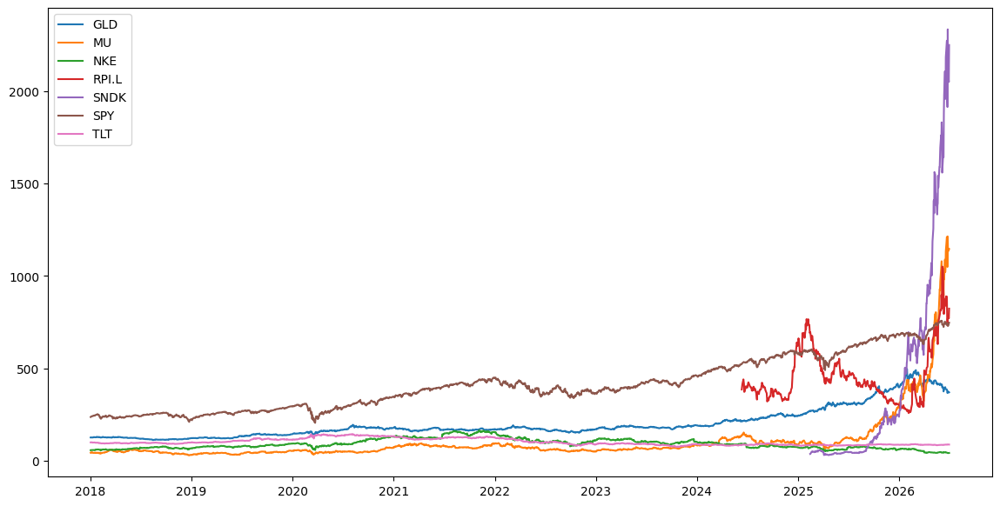

In [16]:
# Plot adjusted close over time per ticker:

import matplotlib.pyplot as plt

df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker", "date"])

plt.figure(figsize=(14, 7))
# Spit the data into groups.
# Go through each ticker one at a time.
for ticker, group in df.groupby("ticker"):
    plt.plot(group["date"], group["adj_close"], label=ticker)

plt.legend()
plt.show()

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


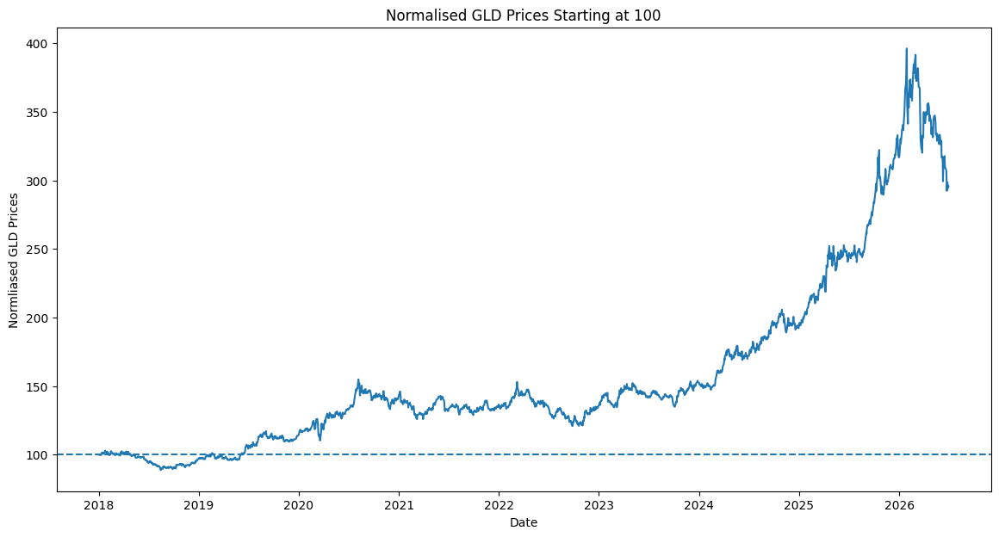

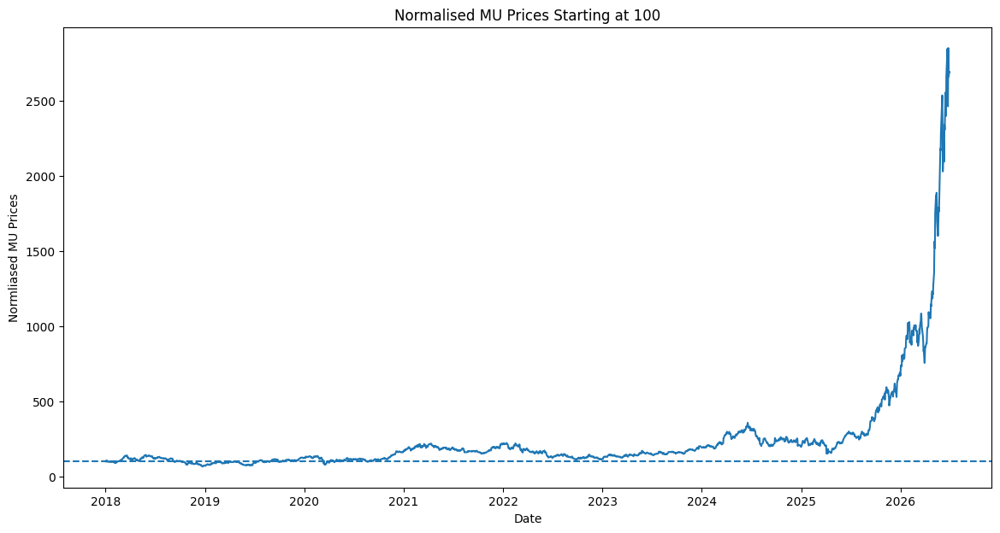

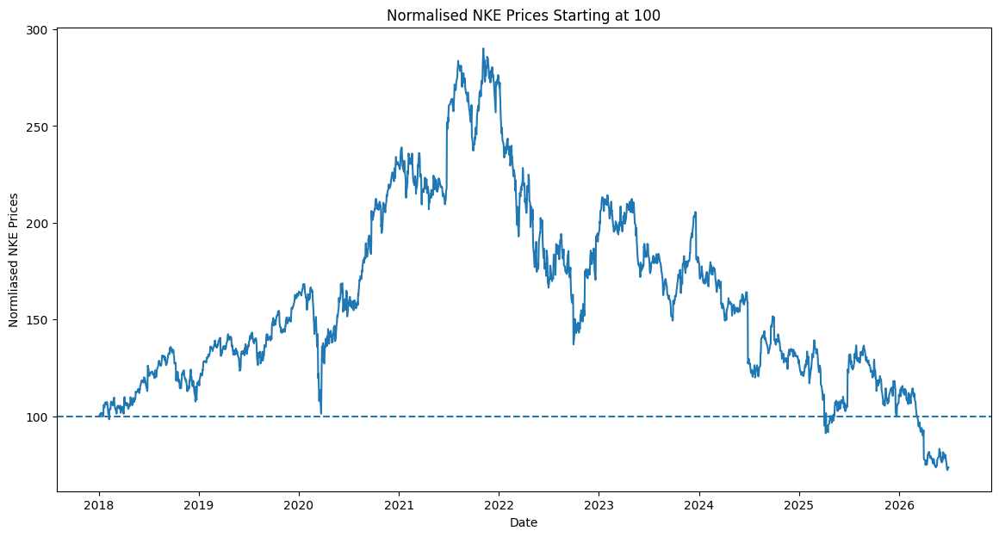

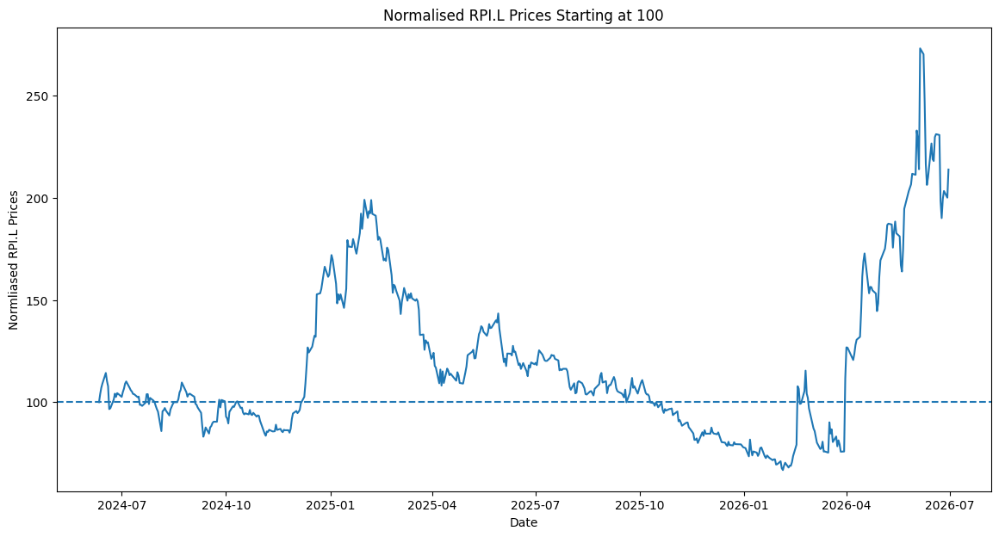

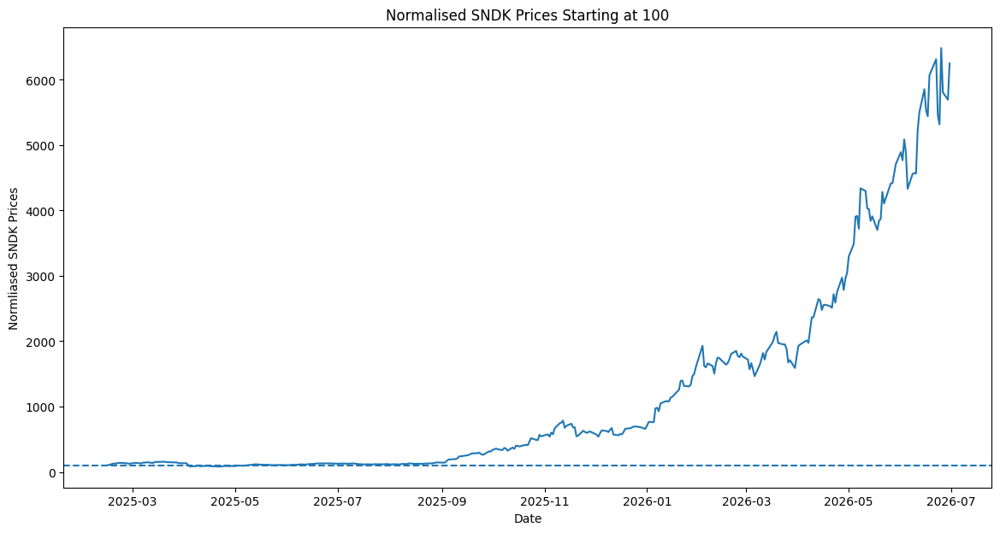

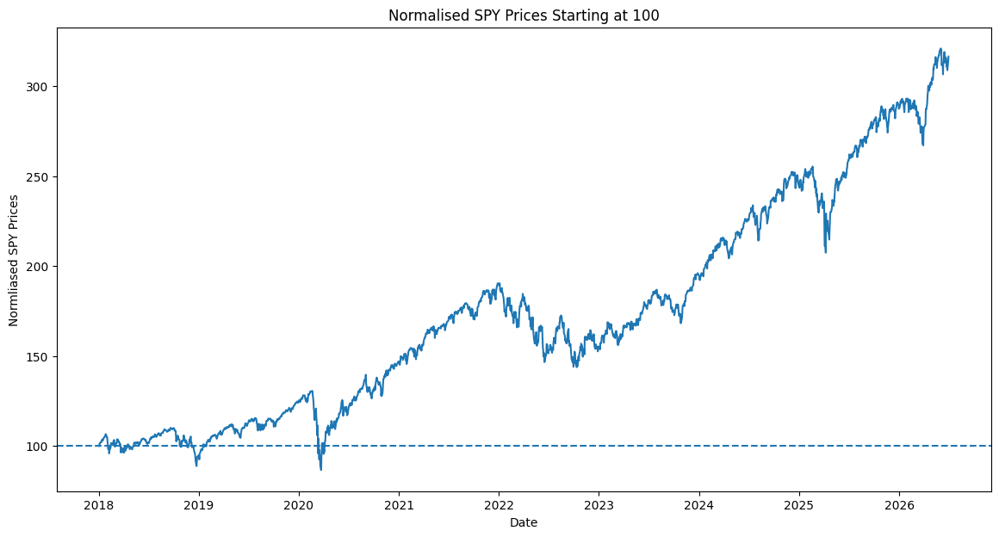

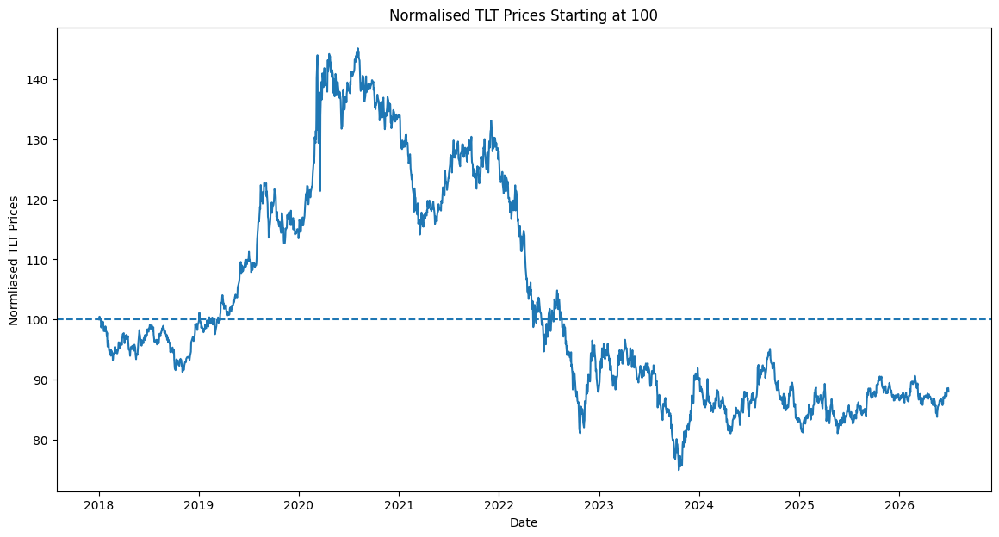

In [17]:
# Compare normalized prices starting at 100:

import matplotlib.pyplot as plt

df = pull_calendar_table(
    table_name = "price_features", 
    calendar = CALENDAR
    )
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker", "date"])

df["normalised_close"] = df.groupby("ticker")["adj_close"].transform(
    lambda x: x / x.iloc[0] * 100
)

for ticker, group in df.groupby("ticker"):
    plt.figure(figsize=(14, 7))
    plt.plot(group["date"], group["normalised_close"], label = ticker)
    
    # adds horizontal line at y = 100
    plt.axhline(100, linestyle = "--")
    
    plt.title(f"Normalised {ticker} Prices Starting at 100")
    plt.xlabel("Date")
    plt.ylabel(f"Normliased {ticker} Prices")
    plt.show()



Identify major price jumps or drops:

- 3 equity tickers (MU, RPI.L, and SNDK) show huge price jumps round the start of 2026. 
- MU relatively stable price until mid 2025 where rapid growth sees stock 25x in under a year.
- SNDK in particular has shown a massive price jump going to 60x normalised price since it began trading.
- RPI.L had a large price jump at start of 2025 and 2026.

- the remaining tickers in comparison show relatively lower price movements.
- GLD showed relatively steep rise 2024-2026 compared to 2018-2025. Sharp drop in 2026-present.
- NKE in comparison shows minimal jumps but in relativity had steep drop in 2020 which led into steep build up then steep drop after 2022.
- TLT show relatively steep drops in cyclical periods through years.

Check whether any ticker behaves unusually:
- 3 equity stocks chosen experienced huge growth recently due to infrastructure demand for AI. There recent popularity in the news was the reason they were chosen.
- NKE has had negative growth since 2022.


### 4. Return analysis
- [ ] Plot daily returns over time
- [ ] Plot return distributions
- [ ] Compare average daily returns by ticker
- [ ] Compare return volatility by ticker
- [ ] Identify extreme return days
- [ ] Check skewness/kurtosis if you want extra depth
- [ ] Write 2–3 observations


In [18]:
print(df.columns)

Index(['ticker', 'date', 'open', 'high', 'low', 'close', 'adj_close', 'volume',
       'daily_return_no_calendar', 'log_return_no_calendar',
       'cumulative_returns_no_calendar', 'rolling_7d_return_no_calendar',
       'rolling_30d_return_no_calendar', 'lag_1_return_no_calendar',
       'lag_5_return_no_calendar', 'moving_avg_20_no_calendar',
       'moving_avg_50_no_calendar', 'price_vs_ma20_no_calendar',
       'relative_volume_no_calendar', 'rolling_30d_volatility_no_calendar',
       'drawdown_no_calendar', 'target_next_day_return_no_calendar',
       'target_direction_no_calendar', 'normalised_close'],
      dtype='str')


[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


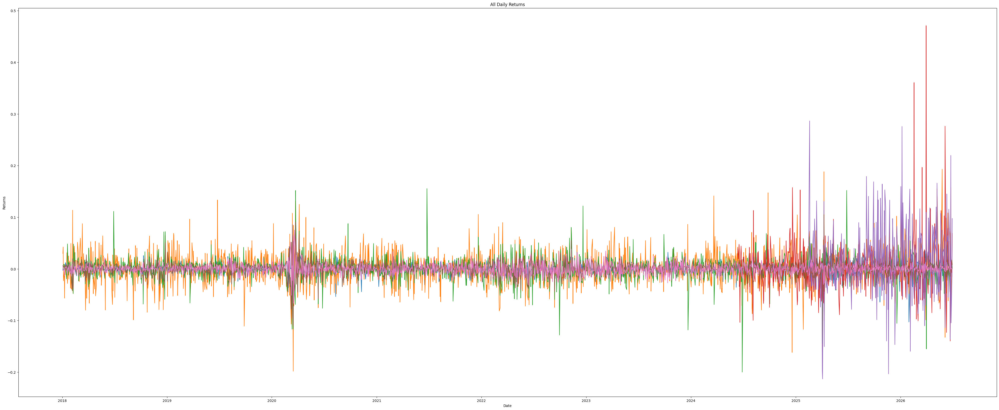

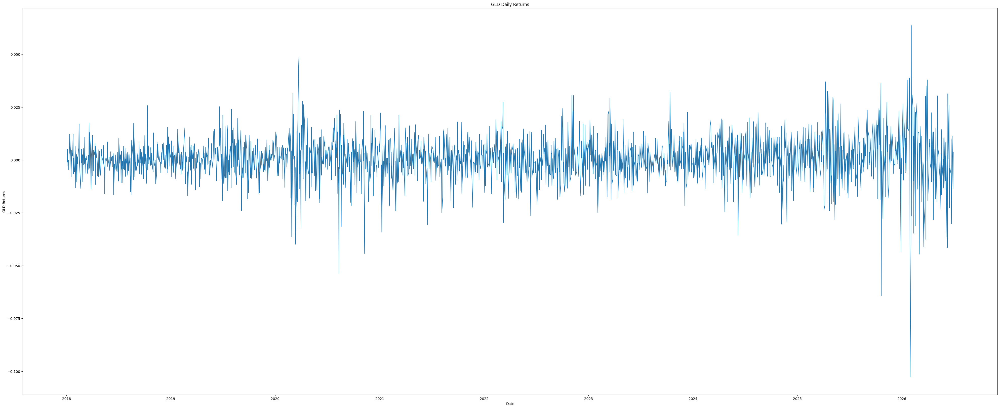

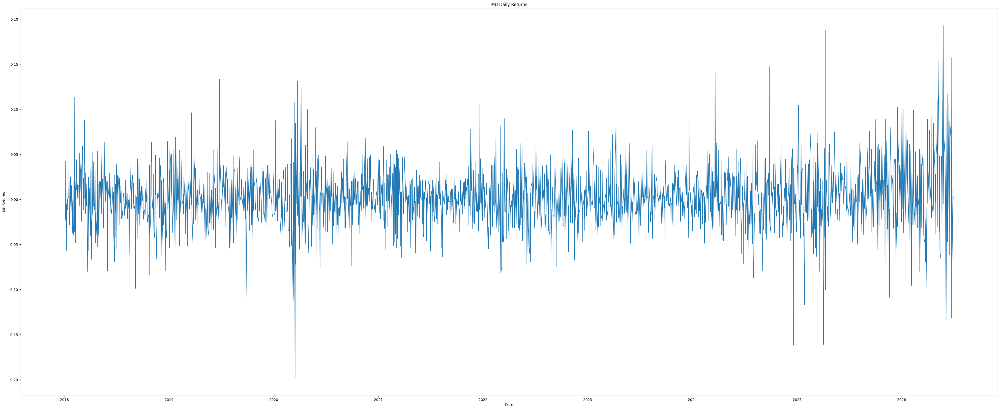

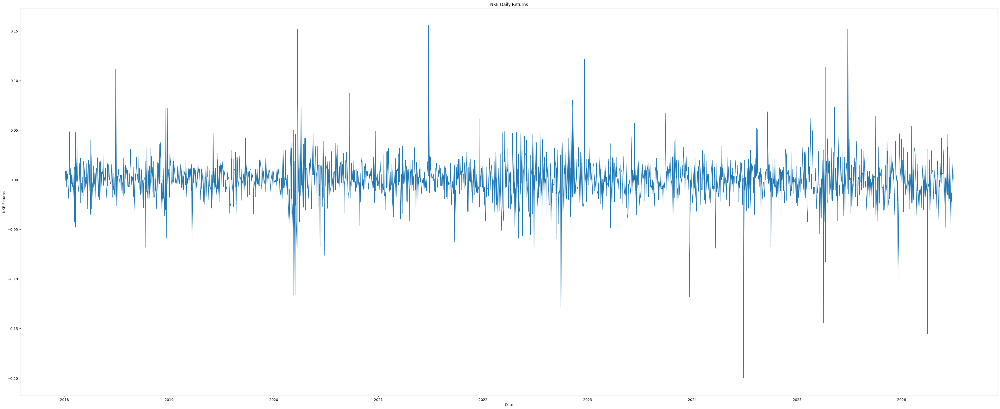

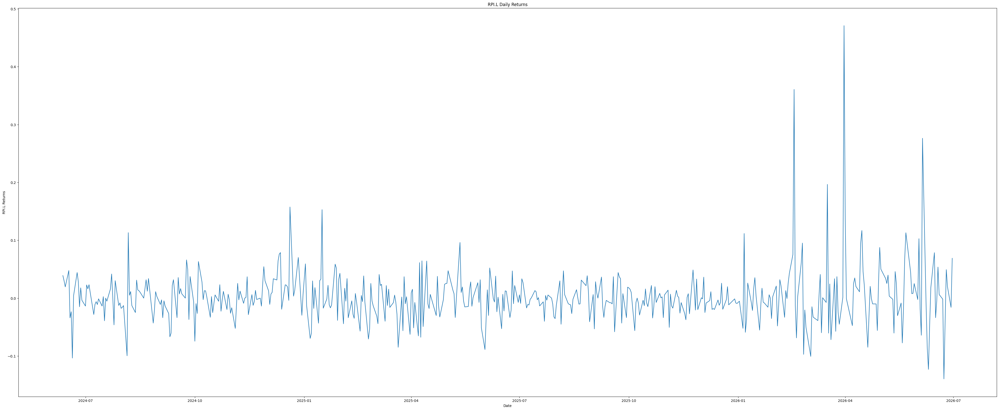

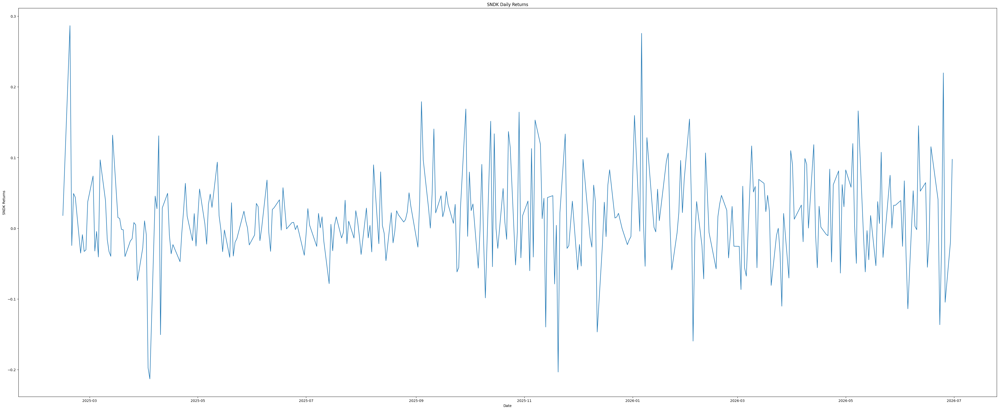

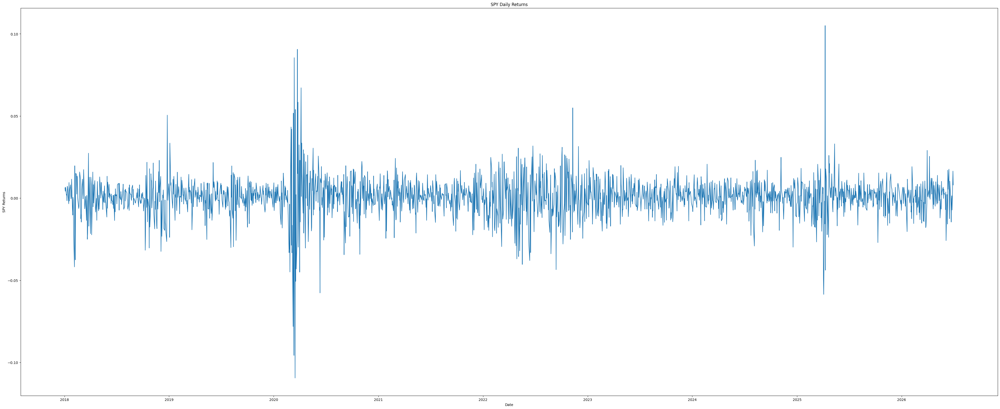

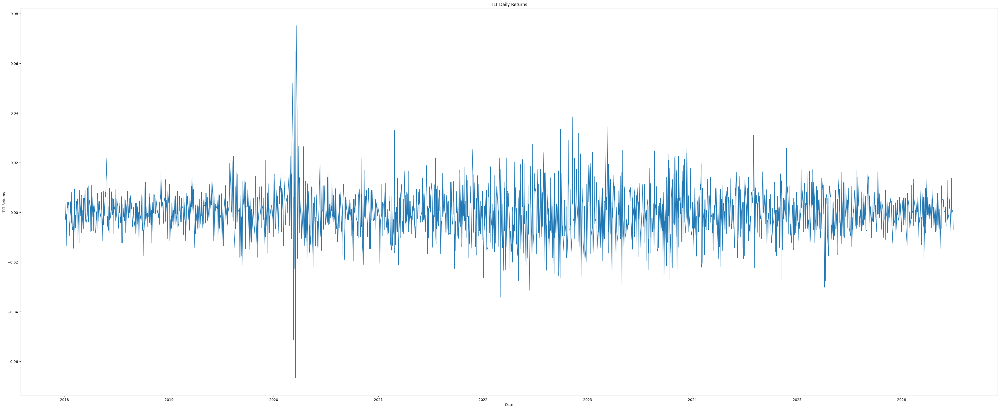

In [19]:
# Plot daily returns over time

import matplotlib.pyplot as plt

df = pull_calendar_table(
    table_name = "price_features",
    calendar = CALENDAR
)

daily_return = f"daily_return_{CALENDAR}"

df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker", "date"])

plt.figure(figsize=(50,20))

for ticker, group in df.groupby("ticker"):
    plt.plot(group["date"], group[daily_return], label = ticker)

plt.title("All Daily Returns")
plt.xlabel("Date")
plt.ylabel("Returns")
plt.show()

for ticker, group in df.groupby("ticker"):
    plt.figure(figsize=(50,20))
    plt.plot(group["date"], group[daily_return], label = ticker)
    plt.title(f"{ticker} Daily Returns")
    plt.xlabel("Date")
    plt.ylabel(f"{ticker} Returns")
    plt.show()

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


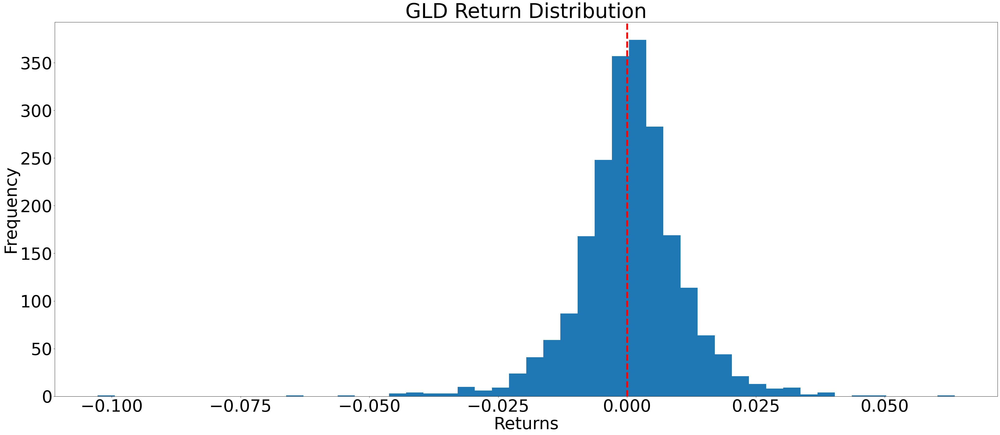

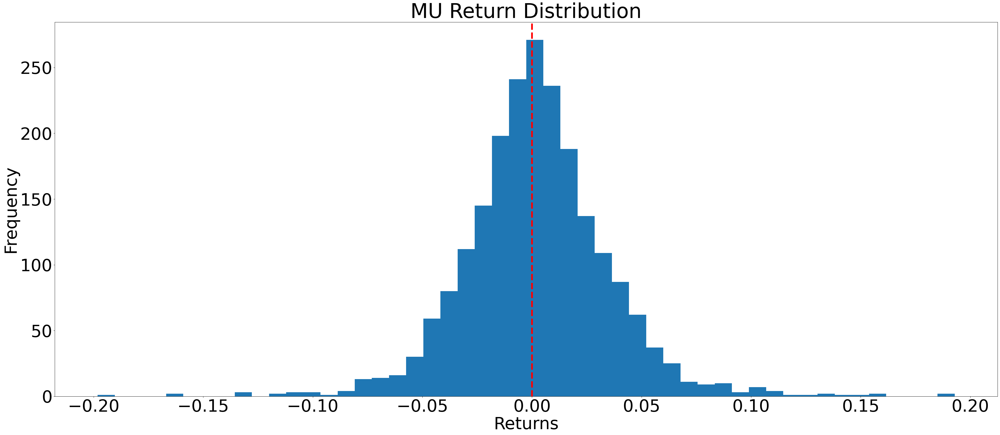

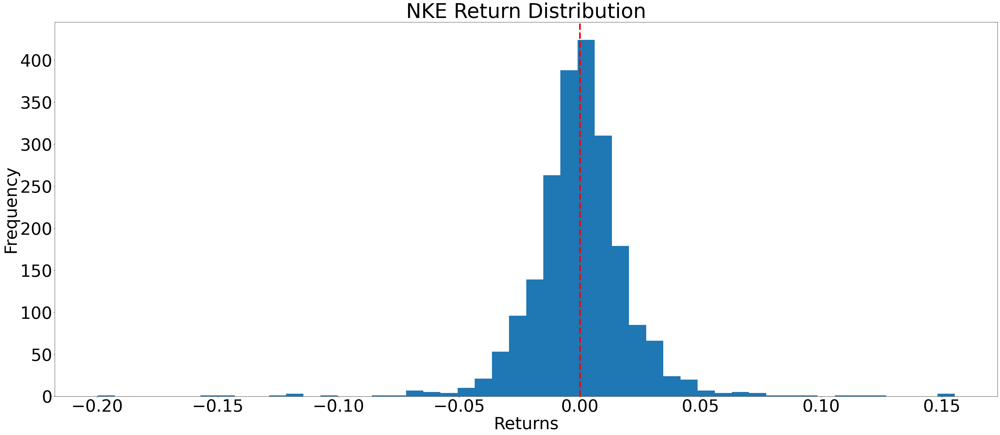

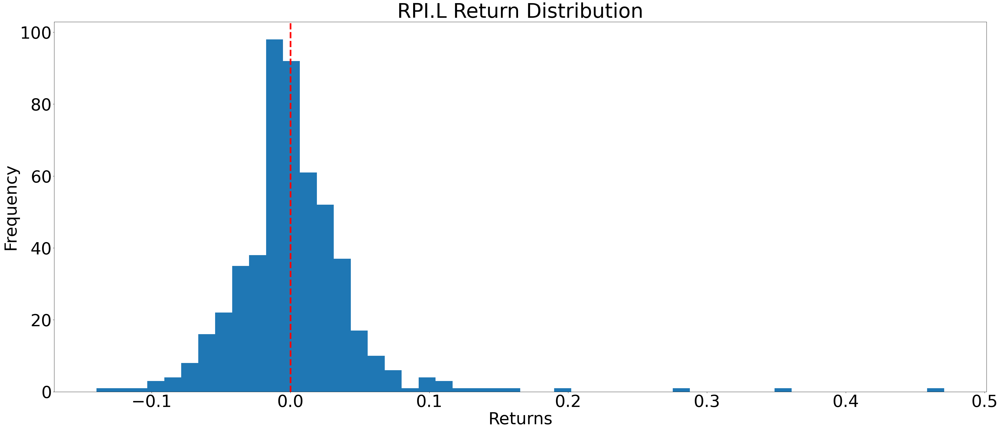

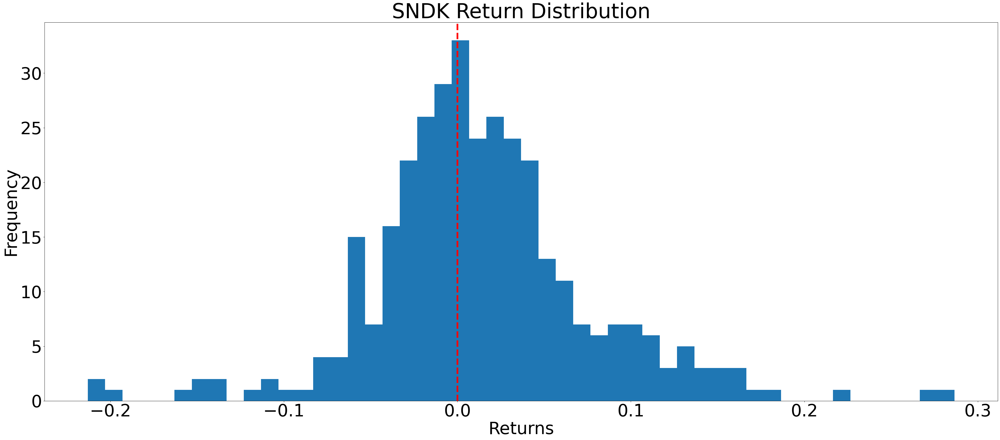

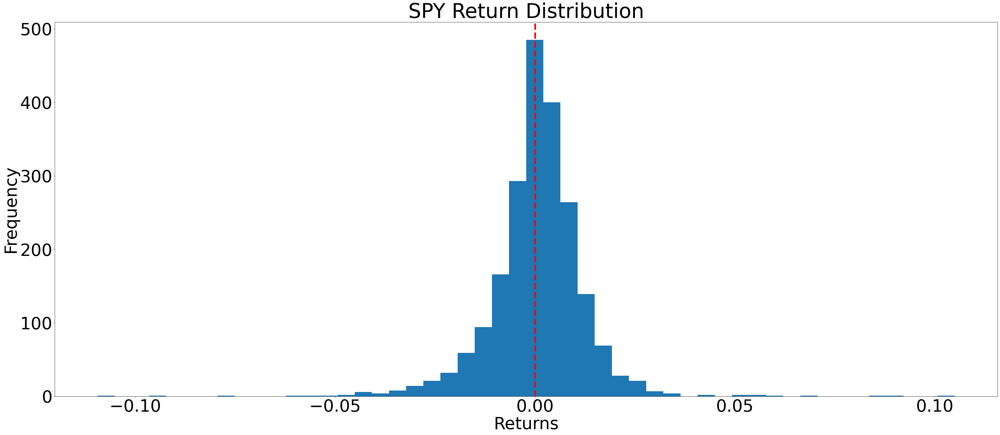

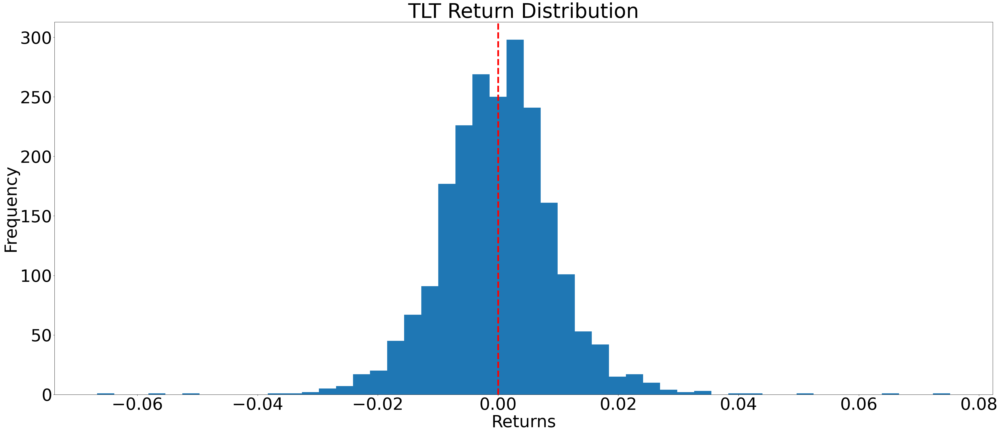

In [20]:
# Plot return distributions

import matplotlib.pyplot as plt

df = pull_calendar_table(
    table_name = "price_features",
    calendar = CALENDAR
)
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker", "date"])

daily_return = f"daily_return_{CALENDAR}"

for ticker, group in df.groupby("ticker"):
    returns = group[daily_return]
    plt.figure(figsize=(50,20))
    plt.hist(returns.dropna(), bins=50)
    plt.title(f"{ticker} Return Distribution", fontsize = 60)
    plt.xticks(fontsize=50)
    plt.yticks(fontsize=50)
    plt.xlabel("Returns", fontsize = 50)
    plt.ylabel("Frequency", fontsize = 50)
    plt.axvline(0, linestyle = "--", color = "red", linewidth = "5")
    plt.show()

In [21]:
# Compare average daily returns and volatility by ticker

df = pull_calendar_table(
    table_name = "price_features",
    calendar = CALENDAR
)
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker", "date"])

daily_return = f"daily_return_{CALENDAR}"

summary = (
    df.groupby("ticker")[daily_return]
    .agg(
        average_daily_return="mean",
        volatility="std",
        observations="count"
    )
)

summary_pct = summary.copy()

summary_pct["average_daily_return"] = summary_pct["average_daily_return"] * 100
summary_pct["volatility"] = summary_pct["volatility"] * 100

summary_pct = summary_pct.sort_values("average_daily_return", ascending=False)

summary_pct


[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


,average_daily_return,volatility,observations
ticker,,,
SNDK,1.411833,6.432743,344
RPI.L,0.249870,4.739403,518
MU,0.209082,3.310103,2133
SPY,0.061367,1.209078,2133
GLD,0.056448,1.058841,2133
NKE,0.008651,2.138669,2133
TLT,-0.001260,0.973838,2133


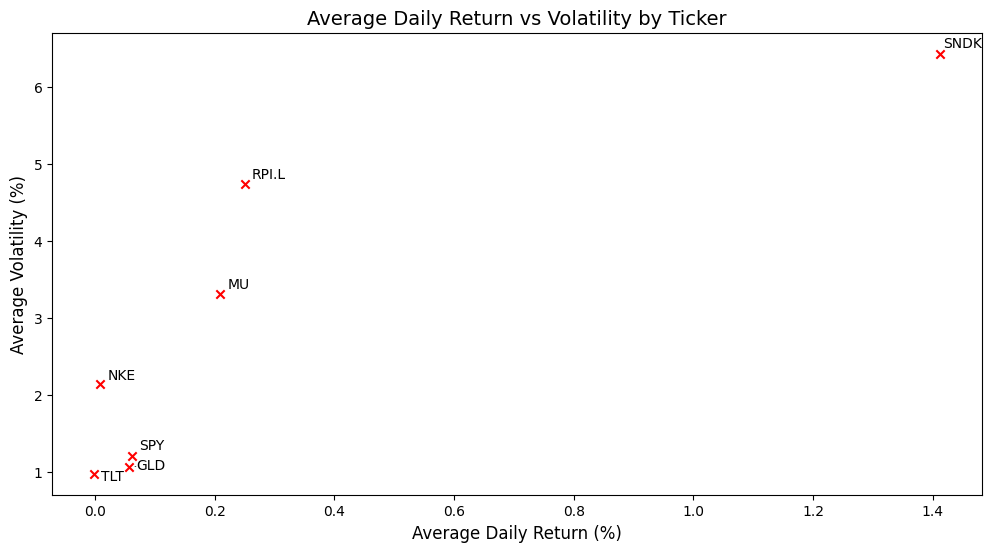

In [22]:
import matplotlib.pyplot as plt
from adjustText import adjust_text

plt.figure(figsize=(12,6))

plt.scatter(
    summary_pct["average_daily_return"],
    summary_pct["volatility"],
    marker = "x",
    color = "red"
    
)

texts = []
for ticker in summary_pct.index:
    texts.append(
        plt.text(
            0.01 + summary_pct.loc[ticker, "average_daily_return"],
            0.01 + summary_pct.loc[ticker, "volatility"],
            ticker
        )
    )

adjust_text(
    texts,
    x=summary_pct["average_daily_return"],
    y=summary_pct["volatility"],
    arrowprops=dict(arrowstyle="-", lw=0.5)
)


plt.ylabel("Average Volatility (%)", fontsize=12)
plt.xlabel("Average Daily Return (%)", fontsize=12)
plt.title("Average Daily Return vs Volatility by Ticker", fontsize=14)

plt.show()

In [23]:
# Identify extreme return days

# 1. Table view
df = pull_calendar_table(
    table_name = "price_features",
    calendar = CALENDAR
)
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker", "date"])

daily_return = f"daily_return_{CALENDAR}"

df["return_mean"] = df.groupby("ticker")[daily_return].transform("mean")

df["return_std"] = df.groupby("ticker")[daily_return].transform("std")

df["return_zscore"] = (
    (df[daily_return] - df["return_mean"]) / df["return_std"]
)

extreme_days = df[df["return_zscore"].abs() > 3]

extreme_days_view = (
    extreme_days[
        ["ticker", "date", daily_return, "return_zscore"]
    ]
    .sort_values("return_zscore")
)

extreme_days_view

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


,ticker,date,daily_return_no_calendar,return_zscore
10398,GLD,2026-01-30,-0.102742,-9.756602
10857,NKE,2024-06-28,-0.199809,-9.346718
3860,SPY,2020-03-16,-0.109424,-9.100925
11073,SPY,2020-03-12,-0.095677,-7.963997
6525,NKE,2026-04-01,-0.155055,-7.254108
...,...,...,...,...
6710,SPY,2020-03-24,0.090603,7.442831
10968,RPI.L,2026-02-17,0.360656,7.557008
4123,TLT,2020-03-20,0.075196,7.722881
8275,SPY,2025-04-09,0.105019,8.635152


In [24]:
# 2. Count by ticker
extreme_counts = (
    extreme_days
    .groupby("ticker")
    .size()
    .sort_values(ascending=False)
)

extreme_counts

ticker
NKE      34
MU       32
GLD      29
SPY      29
TLT      17
SNDK      6
RPI.L     6
dtype: int64

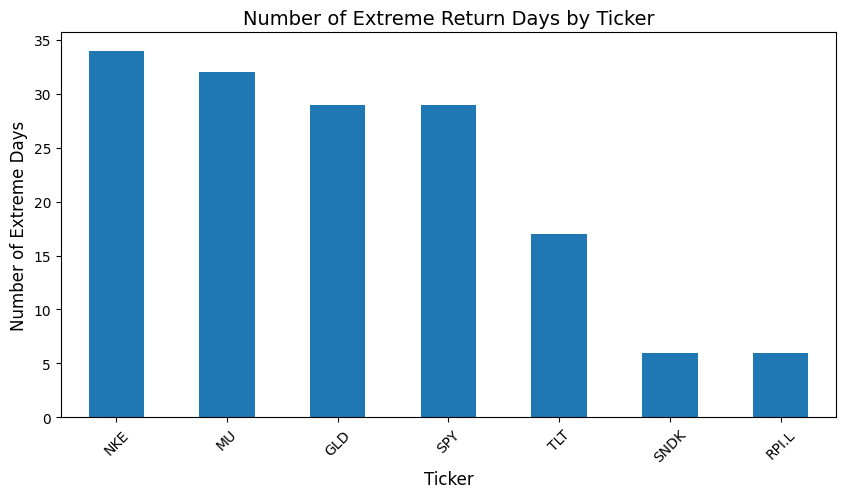

In [25]:
# 3. Bar plot of counts
plt.figure(figsize=(10, 5))

extreme_counts.plot(kind="bar")

plt.title("Number of Extreme Return Days by Ticker", fontsize=14)
plt.xlabel("Ticker", fontsize=12)
plt.ylabel("Number of Extreme Days", fontsize=12)

plt.xticks(rotation=45)
plt.show()

In [26]:
# Check skewness/kurtosis if you want extra depth

daily_return = f"daily_return_{CALENDAR}"

distribution_summary = (
    df.groupby("ticker")[daily_return]
      .agg(
          mean_return="mean",
          volatility="std",
          skewness="skew",
          kurtosis="kurt",
          observations="count"
      )
)

distribution_summary



,mean_return,volatility,skewness,kurtosis,observations
ticker,,,,,
GLD,0.000564,0.010588,-0.636367,7.305299,2133
MU,0.002091,0.033101,0.175578,3.593143,2133
NKE,0.000087,0.021387,-0.268748,12.821108,2133
RPI.L,0.002499,0.047394,3.267675,26.666113,518
SNDK,0.014118,0.064327,0.345475,2.506943,344
SPY,0.000614,0.012091,-0.294439,13.116533,2133
TLT,-0.000013,0.009738,0.161246,5.043367,2133


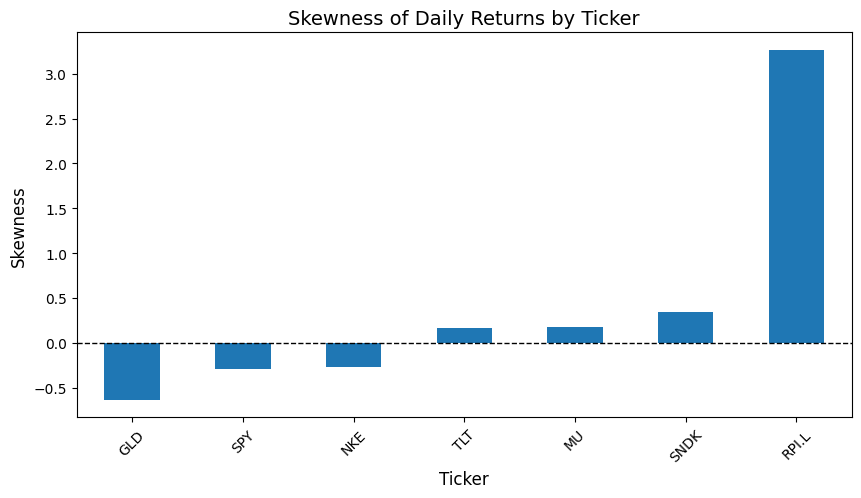

In [27]:
import matplotlib.pyplot as plt

skewness_by_ticker = distribution_summary["skewness"].sort_values()

plt.figure(figsize=(10, 5))

skewness_by_ticker.plot(kind="bar")

plt.axhline(0, color="black", linestyle="--", linewidth=1)

plt.title("Skewness of Daily Returns by Ticker", fontsize=14)
plt.xlabel("Ticker", fontsize=12)
plt.ylabel("Skewness", fontsize=12)

plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)

plt.show()

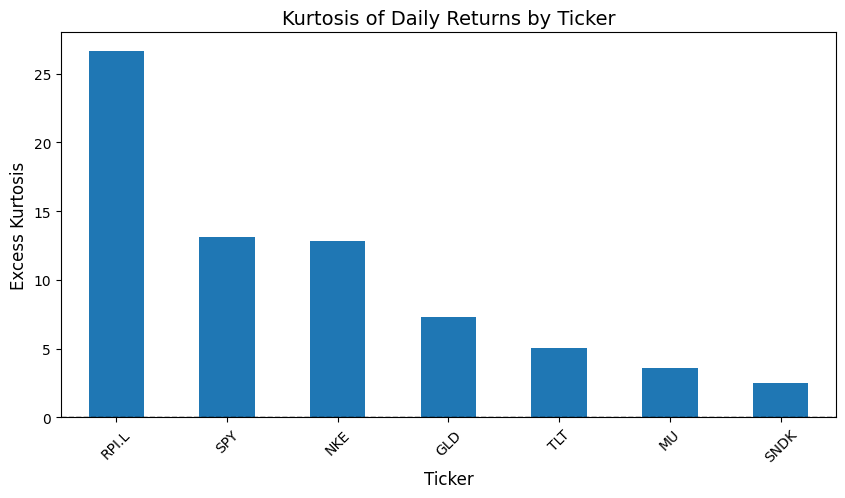

In [28]:
kurtosis_by_ticker = distribution_summary["kurtosis"].sort_values(ascending=False)

plt.figure(figsize=(10, 5))

kurtosis_by_ticker.plot(kind="bar")

plt.axhline(0, color="black", linestyle="--", linewidth=1)

plt.title("Kurtosis of Daily Returns by Ticker", fontsize=14)
plt.xlabel("Ticker", fontsize=12)
plt.ylabel("Excess Kurtosis", fontsize=12)

plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)

plt.show()

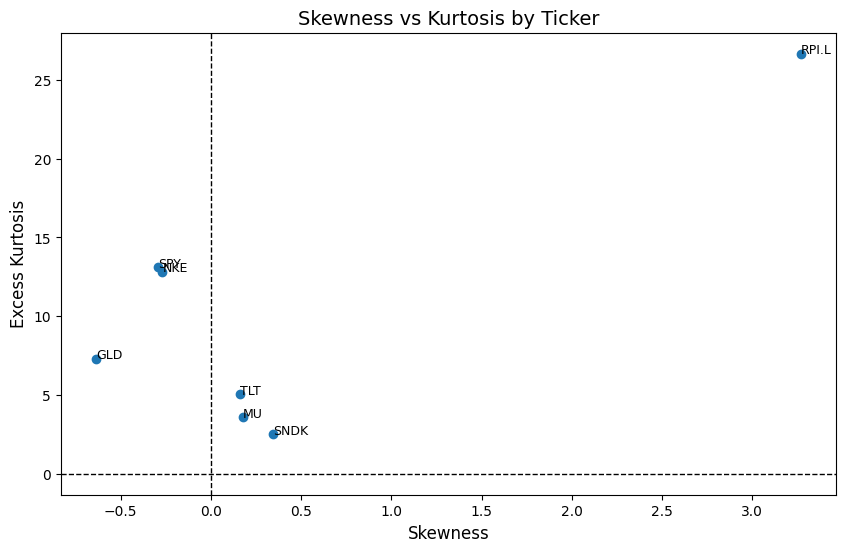

In [29]:
plt.figure(figsize=(10, 6))

plt.scatter(
    distribution_summary["skewness"],
    distribution_summary["kurtosis"]
)

for ticker in distribution_summary.index:
    plt.text(
        distribution_summary.loc[ticker, "skewness"],
        distribution_summary.loc[ticker, "kurtosis"],
        ticker,
        fontsize=9
    )

plt.axvline(0, color="black", linestyle="--", linewidth=1)
plt.axhline(0, color="black", linestyle="--", linewidth=1)

plt.title("Skewness vs Kurtosis by Ticker", fontsize=14)
plt.xlabel("Skewness", fontsize=12)
plt.ylabel("Excess Kurtosis", fontsize=12)

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

### 5. Risk analysis
- [ ] Plot rolling volatility by ticker
- [ ] Identify periods of high volatility
- [ ] Calculate max drawdown by ticker
- [ ] Plot drawdown over time
- [ ] Compare risk across assets
- [ ] Write 2–3 observations

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


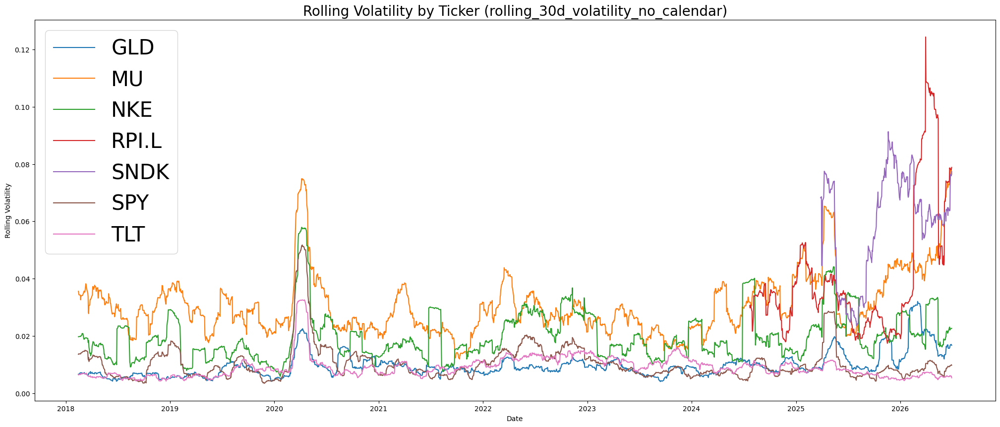

In [30]:
# Plot rolling volatility

df = pull_calendar_table(
    table_name = "price_features",
    calendar = CALENDAR
)

df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker", "date"])

df_volatility = df.columns[
    df.columns.str.contains("volatility", case=False, na=False)
].to_list()

for vol_col in df_volatility:

    plt.figure(figsize=(25,10))

    for ticker, group in df.groupby("ticker"):
        plt.plot(group["date"], group[vol_col], label = ticker)

    plt.legend(fontsize = 30)
    plt.title(f"Rolling Volatility by Ticker ({vol_col})", fontsize = 20)
    plt.xlabel("Date")
    plt.ylabel("Rolling Volatility")
    plt.show()

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table
  ticker max_drawdown_date  max_drawdown max_drawdown_pct
0    GLD        2026-06-24     -0.262109          -26.21%
1     MU        2025-04-04     -0.576290          -57.63%
2    NKE        2026-06-26     -0.751048          -75.10%
3  RPI.L        2026-02-04     -0.664230          -66.42%
4   SNDK        2025-04-22     -0.475009          -47.50%
5    SPY        2020-03-23     -0.337173          -33.72%
6    TLT        2023-10-19     -0.483511          -48.35%


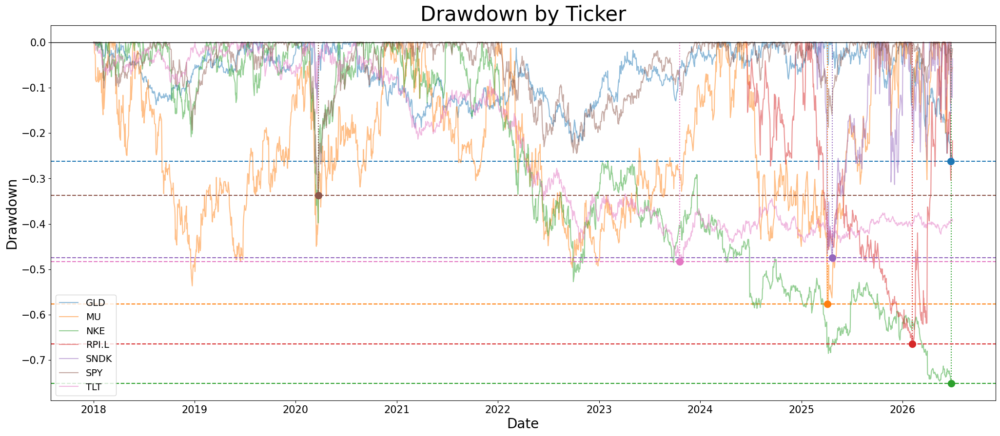

In [31]:
# Calculate maxdrawdown by ticker

df = pull_calendar_table(
    table_name = "price_features",
    calendar = CALENDAR
)

df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker", "date"])

drawdown_col = f"drawdown_{CALENDAR}"

max_dd_table = (
    df.loc[df.groupby("ticker")[drawdown_col].idxmin(), ["ticker", "date", drawdown_col]]
    .rename(columns = {
        "date": "max_drawdown_date",
        drawdown_col: "max_drawdown"
    }).reset_index(drop=True)
)

max_dd_table["max_drawdown_pct"] = max_dd_table["max_drawdown"].map(lambda x: f"{x:.2%}")

print(max_dd_table)

plt.figure(figsize = (25, 10))

for ticker, group in df.groupby("ticker"):
    group = group.sort_values("date")
    
    # Plot drawdown series
    line, = plt.plot(group["date"], group[drawdown_col], label=ticker, alpha = 0.5)
    colour = line.get_color()
    
    # Row index of max drawdown point (most negative value)
    max_dd_idx = group[drawdown_col].idxmin()
    
    # Get date and value of max drawdown
    max_dd_date = df.loc[max_dd_idx, "date"]
    max_dd_value = df.loc[max_dd_idx, drawdown_col]
    
    # Horizontal line at max drawdown level
    plt.axhline(
        y=max_dd_value,
        color=colour,
        linestyle="--",
        linewidth=1.5,
        alpha=1
    )
    
    # Vertical line at max drawdown date
    plt.vlines(
        x=max_dd_date,
        ymin=0,
        ymax=max_dd_value,
        color=colour,
        linestyle=":",
        linewidth=1.5,
        alpha=1
    )
    
    # Dot at max drawdown point
    plt.scatter(
        max_dd_date,
        max_dd_value,
        color=colour,
        s=100,
        zorder=5
    )

plt.axhline(0, color="black", linewidth=1)

plt.title("Drawdown by Ticker", fontsize=30)
plt.xlabel("Date", fontsize=20)
plt.ylabel("Drawdown", fontsize=20)
plt.legend(fontsize=14)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.show()

In [32]:
df = pull_calendar_table(
    table_name = "price_features",
    calendar = CALENDAR
)

df["date"] = pd.to_datetime(df["date"])
df = df.sort_values(["ticker", "date"])

volatility_cols = df.columns[
    df.columns.str.contains("volatility", case=False, na=False)
].to_list()

drawdown_cols = df.columns[
    df.columns.str.contains("drawdown", case=False, na=False)
].to_list()

summary_parts = []

# Volatility summaries
for col in volatility_cols:
    temp = (
        df.groupby("ticker")[col]
        .agg(["mean", "max"])
        .rename(columns={
            "mean": f"{col}_avg",
            "max": f"{col}_max"
        })
    )
    summary_parts.append(temp)

# Drawdown summaries
for col in drawdown_cols:
    temp = (
        df.groupby("ticker")[col]
        .agg(["min", "mean"])
        .rename(columns={
            "min": f"{col}_max_drawdown",
            "mean": f"{col}_avg_drawdown"
        })
    )
    summary_parts.append(temp)

risk_table = pd.concat(summary_parts, axis=1).reset_index()

# Add max drawdown dates
date_parts = []

for col in drawdown_cols:
    idx = df.groupby("ticker")[col].idxmin()
    
    temp = (
        df.loc[idx, ["ticker", "date"]]
        .set_index("ticker")
        .rename(columns={"date": f"{col}_max_drawdown_date"})
    )
    
    date_parts.append(temp)

if date_parts:
    drawdown_dates = pd.concat(date_parts, axis=1).reset_index()
    risk_table = risk_table.merge(drawdown_dates, on="ticker", how="left")

display_table = risk_table.copy()

# Format date columns
date_cols = [col for col in display_table.columns if "date" in col.lower()]

for col in date_cols:
    display_table[col] = pd.to_datetime(display_table[col]).dt.strftime("%Y-%m-%d")

# Rename columns for display
display_table = display_table.rename(
    columns=lambda x: (
        x.replace("_", " ")
         .replace("avg", "Average")
         .replace("max", "Max")
         .replace("min", "Min")
         .title()
    )
)

display_table


[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


,Ticker,Rolling 30D Volatility No Calendar Average,Rolling 30D Volatility No Calendar Max,Drawdown No Calendar Max Drawdown,Drawdown No Calendar Average Drawdown,Drawdown No Calendar Max Drawdown Date
0,GLD,0.009651,0.032041,-0.262109,-0.068834,2026-06-24
1,MU,0.030677,0.078493,-0.576290,-0.228375,2025-04-04
2,NKE,0.019770,0.057918,-0.751048,-0.273642,2026-06-26
3,RPI.L,0.040390,0.124341,-0.664230,-0.314874,2026-02-04
4,SNDK,0.058890,0.091301,-0.475009,-0.131877,2025-04-22
5,SPY,0.010360,0.051742,-0.337173,-0.049548,2020-03-23
6,TLT,0.009034,0.032577,-0.483511,-0.229125,2023-10-19


### 6.Correlation analysis
- [ ] Create daily return correlation matrix
- [ ] Compare asset relationships
- [ ] Check whether correlations change during volatile periods
- [ ] Identify diversification patterns
- [ ] Write 1–2 observations

In [33]:
CALENDAR = "no_calendar"
TABLE = "price_features"

df = pull_calendar_table(
    table_name = TABLE,
    calendar = CALENDAR
)

print(df.columns)


[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table
Index(['ticker', 'date', 'open', 'high', 'low', 'close', 'adj_close', 'volume',
       'daily_return_no_calendar', 'log_return_no_calendar',
       'cumulative_returns_no_calendar', 'rolling_7d_return_no_calendar',
       'rolling_30d_return_no_calendar', 'lag_1_return_no_calendar',
       'lag_5_return_no_calendar', 'moving_avg_20_no_calendar',
       'moving_avg_50_no_calendar', 'price_vs_ma20_no_calendar',
       'relative_volume_no_calendar', 'rolling_30d_volatility_no_calendar',
       'drawdown_no_calendar', 'target_next_day_return_no_calendar',
       'target_direction_no_calendar'],
      dtype='str')


In [34]:
LOG_RETURN_COL = f"log_return_{CALENDAR}"

log_returns_df = df.pivot(
    index = "date",
    columns = "ticker",
    values = LOG_RETURN_COL
)

SIMPLE_RETURN_COL = f"daily_return_{CALENDAR}"

simple_returns_df = df.pivot(
    index = "date",
    columns = "ticker",
    values = SIMPLE_RETURN_COL
)

print(f"{LOG_RETURN_COL} table:")
display(log_returns_df.head(5))

print(f"{SIMPLE_RETURN_COL} table:")
display(simple_returns_df.head(5))

log_return_no_calendar table:


ticker,GLD,MU,NKE,RPI.L,SNDK,SPY,TLT
date,,,,,,,
2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03,-0.002640,0.029557,-0.000158,NaN,NaN,0.006305,0.004770
2018-01-04,0.005114,0.041373,-0.000630,NaN,NaN,0.004206,-0.000158
2018-01-05,-0.001037,-0.023307,0.008476,NaN,NaN,0.006642,-0.002860
2018-01-08,-0.000160,-0.005474,0.008870,NaN,NaN,0.001827,-0.000637


daily_return_no_calendar table:


ticker,GLD,MU,NKE,RPI.L,SNDK,SPY,TLT
date,,,,,,,
2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03,-0.002637,0.029998,-0.000158,NaN,NaN,0.006325,0.004781
2018-01-04,0.005127,0.042241,-0.000630,NaN,NaN,0.004215,-0.000158
2018-01-05,-0.001036,-0.023037,0.008512,NaN,NaN,0.006664,-0.002856
2018-01-08,-0.000160,-0.005459,0.008909,NaN,NaN,0.001828,-0.000637


In [35]:
log_corr_matrix = log_returns_df.corr(numeric_only = True)
simple_corr_matrix = simple_returns_df.corr(numeric_only = True)
print(f"{LOG_RETURN_COL} correlation matrix:")
display(log_corr_matrix)
print(f"{SIMPLE_RETURN_COL} correlation matrix:")
display(simple_corr_matrix)
print("Absolute difference:")
diff = abs(log_corr_matrix-simple_corr_matrix)
display(diff)

log_return_no_calendar correlation matrix:


ticker,GLD,MU,NKE,RPI.L,SNDK,SPY,TLT
ticker,,,,,,,
GLD,1.000000,0.115376,0.028416,0.065267,0.155265,0.114374,0.226106
MU,0.115376,1.000000,0.331691,0.154542,0.724875,0.614745,-0.103758
NKE,0.028416,0.331691,1.000000,0.068363,0.157830,0.587365,-0.051546
RPI.L,0.065267,0.154542,0.068363,1.000000,0.147620,0.168558,-0.023290
SNDK,0.155265,0.724875,0.157830,0.147620,1.000000,0.490146,0.013033
SPY,0.114374,0.614745,0.587365,0.168558,0.490146,1.000000,-0.137836
TLT,0.226106,-0.103758,-0.051546,-0.023290,0.013033,-0.137836,1.000000


daily_return_no_calendar correlation matrix:


ticker,GLD,MU,NKE,RPI.L,SNDK,SPY,TLT
ticker,,,,,,,
GLD,1.000000,0.115402,0.029936,0.060590,0.157509,0.115051,0.226556
MU,0.115402,1.000000,0.330817,0.142033,0.714108,0.610692,-0.102584
NKE,0.029936,0.330817,1.000000,0.071240,0.154331,0.589252,-0.053945
RPI.L,0.060590,0.142033,0.071240,1.000000,0.139175,0.163117,-0.024699
SNDK,0.157509,0.714108,0.154331,0.139175,1.000000,0.470376,0.009057
SPY,0.115051,0.610692,0.589252,0.163117,0.470376,1.000000,-0.138457
TLT,0.226556,-0.102584,-0.053945,-0.024699,0.009057,-0.138457,1.000000


Absolute difference:


ticker,GLD,MU,NKE,RPI.L,SNDK,SPY,TLT
ticker,,,,,,,
GLD,0.000000,0.000026,0.001520,0.004677,0.002244,0.000676,0.000451
MU,0.000026,0.000000,0.000873,0.012509,0.010767,0.004053,0.001174
NKE,0.001520,0.000873,0.000000,0.002877,0.003499,0.001887,0.002399
RPI.L,0.004677,0.012509,0.002877,0.000000,0.008446,0.005441,0.001410
SNDK,0.002244,0.010767,0.003499,0.008446,0.000000,0.019769,0.003976
SPY,0.000676,0.004053,0.001887,0.005441,0.019769,0.000000,0.000620
TLT,0.000451,0.001174,0.002399,0.001410,0.003976,0.000620,0.000000


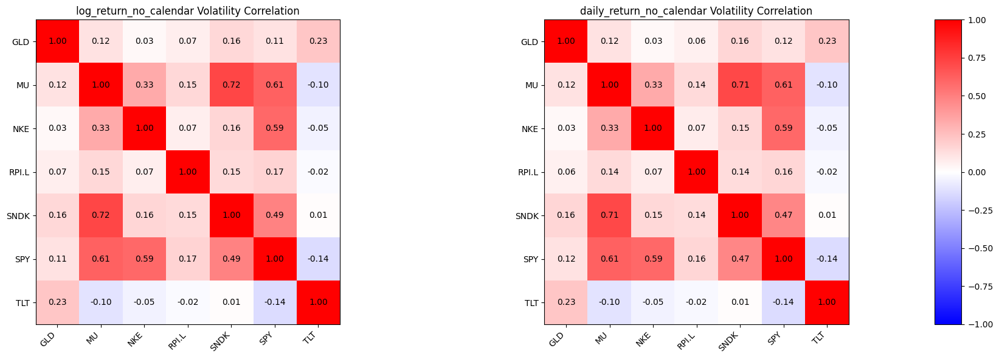

In [36]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(
    1, 3,
    figsize=(18, 6),
    gridspec_kw={"width_ratios": [1, 1, 0.05]}
)

ax1, ax2, cbar_ax = axes

# Matrix 1
im1 = ax1.imshow(log_corr_matrix, cmap = "bwr", vmin=-1, vmax=1)
ax1.set_title(f"{LOG_RETURN_COL} Volatility Correlation")
ax1.set_xticks(range(len(log_corr_matrix.columns)))
ax1.set_yticks(range(len(log_corr_matrix.index)))
ax1.set_xticklabels(log_corr_matrix.columns, rotation=45, ha="right")
ax1.set_yticklabels(log_corr_matrix.index)

for i in range(len(log_corr_matrix.index)):
    for j in range(len(log_corr_matrix.columns)):
        value = log_corr_matrix.iloc[i, j]
        ax1.text(
            j, i,
            f"{value:.2f}",
            ha="center",
            va="center"
        )

# Matrix 2
im2 = ax2.imshow(simple_corr_matrix, cmap = "bwr", vmin=-1, vmax=1)
ax2.set_title(f"{SIMPLE_RETURN_COL} Volatility Correlation")
ax2.set_xticks(range(len(simple_corr_matrix.columns)))
ax2.set_yticks(range(len(simple_corr_matrix.index)))
ax2.set_xticklabels(simple_corr_matrix.columns, rotation=45, ha="right")
ax2.set_yticklabels(simple_corr_matrix.index)

for i in range(len(simple_corr_matrix.index)):
    for j in range(len(simple_corr_matrix.columns)):
        value = simple_corr_matrix.iloc[i, j]
        ax2.text(
            j, i,
            f"{value:.2f}",
            ha="center",
            va="center"
        )

# Colour legend on far right
fig.colorbar(im2, cax=cbar_ax)

plt.tight_layout()
plt.show()

Log returns vs simple returns:
- Log returns are additive but simple returns are multiplicative.
- Additive nature of log returns makes it better for statistical analysis.
- Over single day times frames, the return values are almost identical so it doesn't really matter.
- Generally, it is better to use log returns if you are consistent unless interpreting actual investor gain/loss where simple returns are preferred.
- We never correlate stock price (always use returns) because prices generally always rise.

Pairwise overlap count:


ticker,GLD,MU,NKE,RPI.L,SNDK,SPY,TLT
ticker,,,,,,,
GLD,2133,2133,2133,504,344,2133,2133
MU,2133,2133,2133,504,344,2133,2133
NKE,2133,2133,2133,504,344,2133,2133
RPI.L,504,504,504,518,337,504,504
SNDK,344,344,344,337,344,344,344
SPY,2133,2133,2133,504,344,2133,2133
TLT,2133,2133,2133,504,344,2133,2133


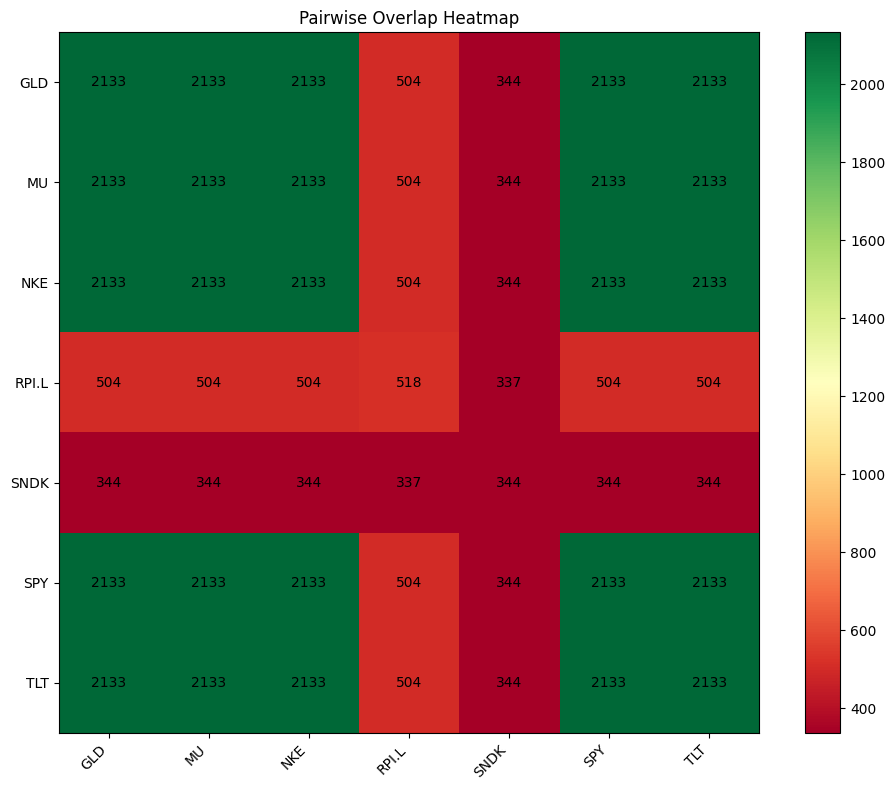

In [37]:
ticker_date_overlap = (
    log_returns_df.notna().astype(int).T
    @ log_returns_df.notna().astype(int)
)

print("Pairwise overlap count:")
display(ticker_date_overlap)

plt.figure(figsize=(10, 8))

plt.imshow(ticker_date_overlap, cmap="RdYlGn")
plt.colorbar()

plt.xticks(
    range(len(ticker_date_overlap.columns)),
    ticker_date_overlap.columns,
    rotation=45,
    ha="right"
)

plt.yticks(
    range(len(ticker_date_overlap.index)),
    ticker_date_overlap.index
)

plt.title("Pairwise Overlap Heatmap")

for i in range(len(ticker_date_overlap.index)):
    for j in range(len(ticker_date_overlap.columns)):
        value = ticker_date_overlap.iloc[i, j]

        plt.text(
            j, i,
            f"{value}",
            ha="center",
            va="center"
        )

plt.tight_layout()
plt.show()

In our data and often in reality, the tickers don't all have the same number of values for various reasons:
- IPO later.
- Missing price records.
- Assets trade on different calendars.
- Some data sources have gaps.
- Holidays differ across exchanges.

After pivoting this will lead non NaNs. By default pandas creates correlations using pairwise observations meaning that the matrix will look compete but each correlation value may be based no a different number of data points.

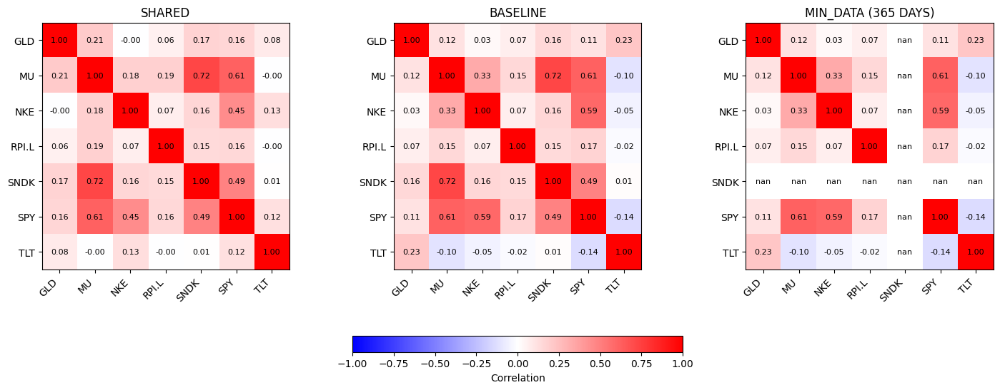

In [38]:
# Baseline.
log_corr_matrix = log_returns_df.corr(numeric_only = True)

# Creates dataframe only where all ticker columns have values.
shared_df = log_returns_df.dropna(axis = 0, how = "any")
shared_corr = shared_df.corr(numeric_only = True)

# Creates correlation if the pariwise combination has the minimum number of datapoints.
mindata_corr = log_returns_df.corr(numeric_only = True, min_periods = 365)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

heatmaps = [
    (shared_corr, "SHARED"),
    (log_corr_matrix, "BASELINE"),
    (mindata_corr, "MIN_DATA (365 DAYS)")
]

# Use same scale if all are correlations/differences
vmin = -1
vmax = 1

for ax, (matrix, title) in zip(axes, heatmaps):
    im = ax.imshow(matrix, cmap="bwr", vmin=vmin, vmax=vmax)

    ax.set_title(title)
    ax.set_xticks(range(len(matrix.columns)))
    ax.set_yticks(range(len(matrix.index)))
    ax.set_xticklabels(matrix.columns, rotation=45, ha="right")
    ax.set_yticklabels(matrix.index)

    for i in range(len(matrix.index)):
        for j in range(len(matrix.columns)):
            value = matrix.iloc[i, j]
            ax.text(
                j, i,
                f"{value:.2f}",
                ha="center",
                va="center",
                fontsize=8
            )
# Shared colour legend across bottom
cbar = fig.colorbar(
    im,
    ax=axes,
    orientation="horizontal",
    fraction=0.05,
    pad=0.20
)

cbar.set_label("Correlation")

plt.show()

Other forms of correlation:
- Pearson: measures linear relationship. If one increases does the other in a straight line?
- Spearman: measures general increase or decrease relationship. Focuses on order rather than explicit difference.
- Kendall: ranked based like Spearman but more conservative and better for smaller datasets.

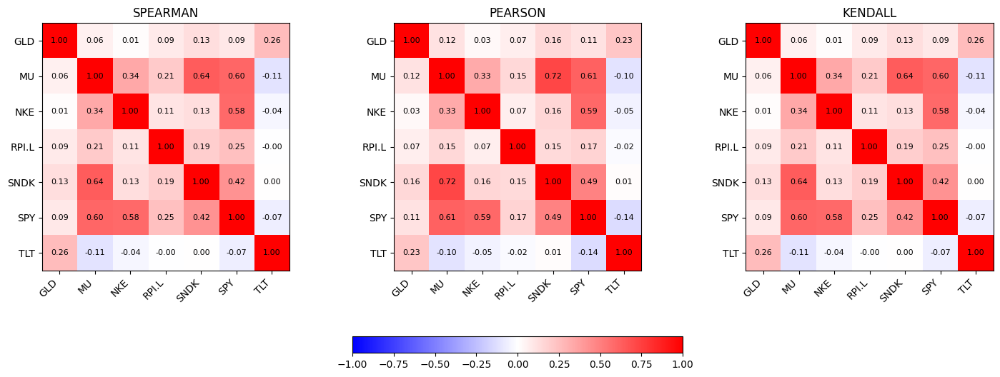

In [39]:
pearson = log_returns_df.corr(numeric_only = True, method="pearson")
spearman = log_returns_df.corr(numeric_only = True, method="spearman")
kendall = log_returns_df.corr(numeric_only = True, method="spearman")

fig, axes = plt.subplots(1, 3, figsize = (18, 6))

heatmaps = [
    (spearman, "SPEARMAN"),
    (pearson, "PEARSON"),
    (kendall, "KENDALL")
]

vmin = -1
vmax = 1

for ax, (matrix, title) in zip(axes, heatmaps):

    im = ax.imshow(matrix, cmap="bwr", vmin=vmin, vmax=vmax)

    ax.set_title(title)
    ax.set_xticks(range(len(matrix.columns)))
    ax.set_yticks(range(len(matrix.index)))
    ax.set_xticklabels(matrix.columns, rotation=45, ha="right")
    ax.set_yticklabels(matrix.index)

    for i in range(len(matrix.index)):
        for j in range(len(matrix.columns)):
            value = matrix.iloc[i,j]
            ax.text(
                j, i,
                f"{value:.2f}",
                ha="center",
                va="center",
                fontsize=8
            )

cbar = fig.colorbar(
    im,
    ax=axes,
    orientation="horizontal",
    fraction=0.05,
    pad=0.20
)

Practical rules:
- standard stock correlation matrix: pearson correaltion on returns.
- portfolio risk / covariance: pearson correlation on returns.
- outlier-resistant comparison: spearman on returns.
- ranking/co-movement analysis: spearman or kendall.
- smaller dataset: kendall.

#### Interpret the matrix:

Even after taking into account the different variations in defining correlation matrices the general trends are the same.

- Do any move identically (strong positive) or exactly opposite (strong negative)?

We see MU and SNDK with relatively strong positive correlation likely due to their similar involvement in the AI movement. No real assets have negative correlations.

- Which assets have weak relationships (low correlation)? 

TLT with most tickers are basically not related at all, apart from GLD. This is likely due to their similar effect as safety assets during times of crises.


- Which assets are almost independent (low correlation provides diversification)? 

TLT with RPI.L and SNDK are basically independent of each other not showing any comovement at all.

- Which assets are surprising (those that expected to move together and don't or those that do have a relationship)?

I think NKE slight positive correlation with SPY over time is quite surprising indicating a simlar general trends in the sample period.



Relationships between assets are not fixed. For example, during normal markets stocks and bonds may have weak correlation, but during crises many assets begin falling together. Correlation often falls during market crashes. Volatile periods are where markets move much more than usual, e.g., COVID crash, look at volatility line graph. 

It is best to define one share high-volatility period using either:
- SPY volatility.
- market index volatility.
- portfolio volatility.
- average volatility across all tickers.

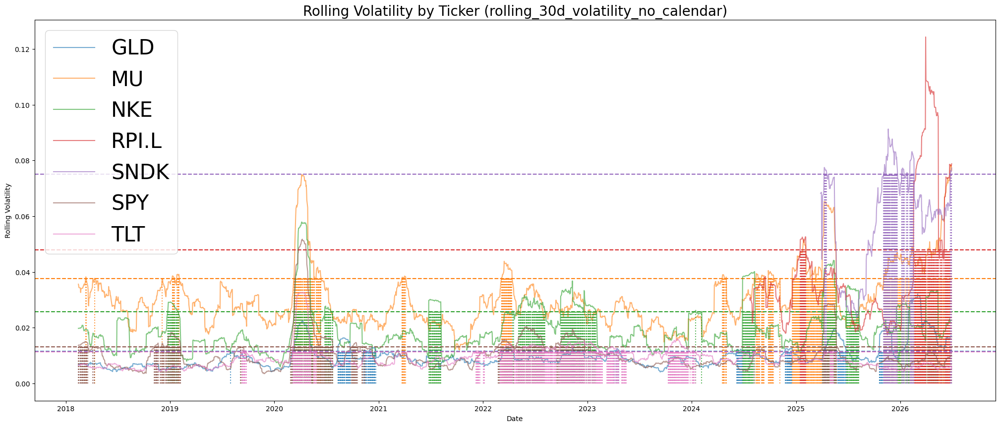

In [40]:
plt.figure(figsize = (25,10))

df = df.sort_values(["ticker", "date"])

for ticker, group in df.groupby("ticker"):
    line, = plt.plot(group["date"], group[f"rolling_30d_volatility_{CALENDAR}"], label = ticker, alpha = 0.6)
    colour = line.get_color()

    qtr_80 = group[vol_col].quantile(0.80)
    plt.axhline(
        y=qtr_80,
        color=colour,
        linestyle="--",
        linewidth=1.5,
        alpha=1
    )

    date_80 = group.loc[group[vol_col] >= qtr_80, "date"]
    plt.vlines(
        x=date_80,
        ymin=0,
        ymax=qtr_80,
        color=colour,
        linestyle=":",
        linewidth=1.5,
        alpha=0.8
    )

plt.legend(fontsize = 30)
plt.title(f"Rolling Volatility by Ticker ({vol_col})", fontsize = 20)
plt.xlabel("Date")
plt.ylabel("Rolling Volatility")
plt.show()

Do stocks become more correlated when markets are stressed? Are there still assets that behave differently or diversify?

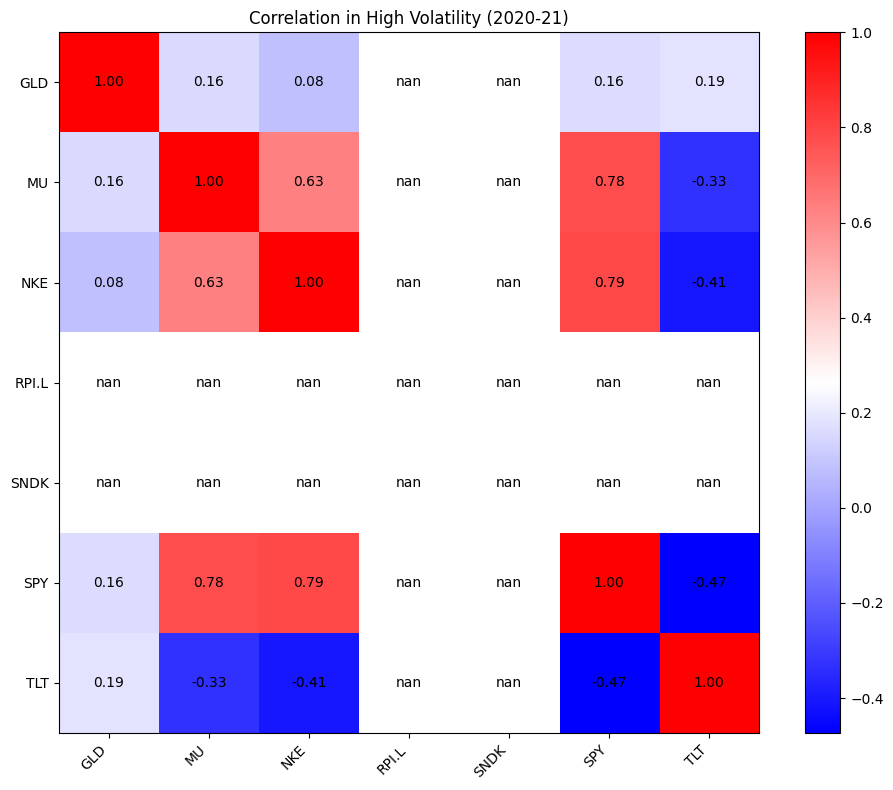

In [41]:
_20to21_df = log_returns_df.loc["2020-01-01":"2021-01-01"]
_20to21_corr = _20to21_df.corr(numeric_only = True)

plt.figure(figsize=(10,8))

plt.imshow(_20to21_corr, cmap="bwr")
plt.colorbar()

plt.xticks(
    range(len(_20to21_corr.columns)), 
    _20to21_corr.columns,
    rotation=45,
    ha="right")

plt.yticks(
    range(len(_20to21_corr.index)),
    _20to21_corr.index
)

plt.title("Correlation in High Volatility (2020-21)")

for i in range(len(_20to21_corr.index)):
    for j in range(len(_20to21_corr.columns)):
        value = _20to21_corr.iloc[i,j]

        plt.text(
            j,i,
            f"{value:.2f}",
            ha="center",
            va="center"
        )
    
plt.tight_layout()
plt.show()


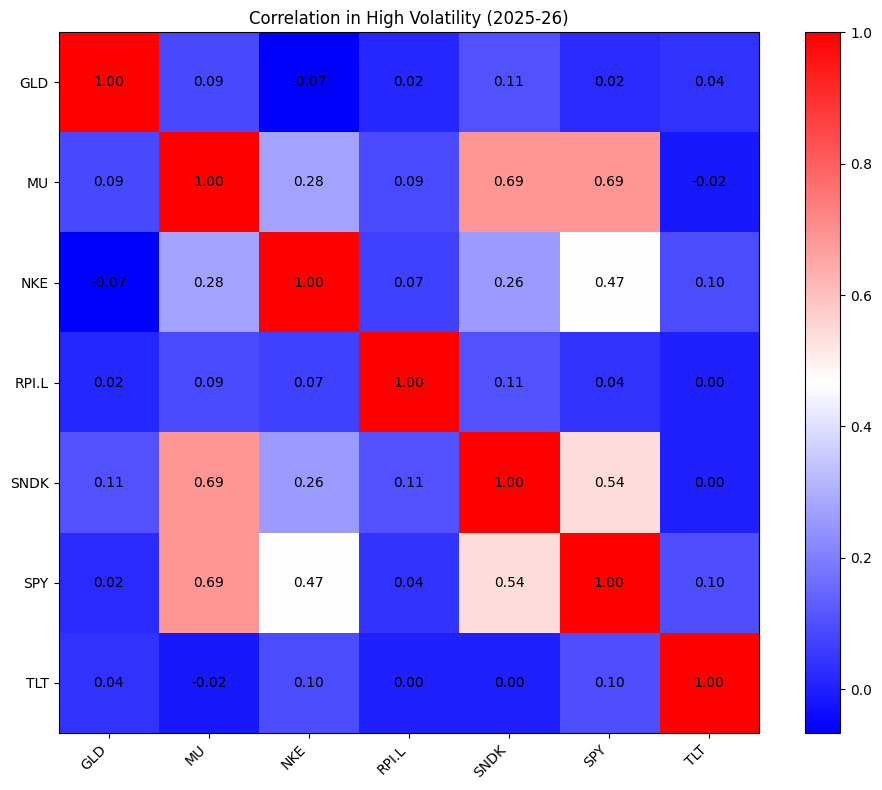

In [42]:
_25to26_df = log_returns_df.loc["2025-01-01":"2026-01-01"]
_25to26_corr = _25to26_df.corr(numeric_only = True)

plt.figure(figsize=(10,8))

plt.imshow(_25to26_corr , cmap="bwr")
plt.colorbar()

plt.xticks(
    range(len(_25to26_corr.columns)), 
    _25to26_corr .columns,
    rotation=45,
    ha="right")

plt.yticks(
    range(len(_25to26_corr.index)),
    _25to26_corr .index
)

plt.title("Correlation in High Volatility (2025-26)")

for i in range(len(_25to26_corr.index)):
    for j in range(len(_25to26_corr.columns)):
        value = _25to26_corr.iloc[i,j]

        plt.text(
            j,i,
            f"{value:.2f}",
            ha="center",
            va="center"
        )
    
plt.tight_layout()
plt.show()


### 7. Feature analysis
* \[ ] Inspect moving averages
* \[ ] Plot adj\_close vs moving averages
* \[ ] Inspect price\_vs\_ma20
* \[ ] Inspect relative\_volume
* \[ ] Inspect lagged returns
* \[ ] Inspect rolling returns
* \[ ] Check whether feature values look sensible
* \[ ] Check feature distributions


In [44]:
import pandas as pd

TABLE_NAME="price_features"
CALENDAR="no_calendar"

df = pull_calendar_table(
    table_name=TABLE_NAME,
    calendar=CALENDAR
)

df.columns

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


Index(['ticker', 'date', 'open', 'high', 'low', 'close', 'adj_close', 'volume',
       'daily_return_no_calendar', 'log_return_no_calendar',
       'cumulative_returns_no_calendar', 'rolling_7d_return_no_calendar',
       'rolling_30d_return_no_calendar', 'lag_1_return_no_calendar',
       'lag_5_return_no_calendar', 'moving_avg_20_no_calendar',
       'moving_avg_50_no_calendar', 'price_vs_ma20_no_calendar',
       'relative_volume_no_calendar', 'rolling_30d_volatility_no_calendar',
       'drawdown_no_calendar', 'target_next_day_return_no_calendar',
       'target_direction_no_calendar'],
      dtype='str')

In [68]:
import matplotlib.pyplot as plt

ma_cols = df.columns[
    df.columns.str.contains("moving_avg", case = False, na=False)
].to_list()

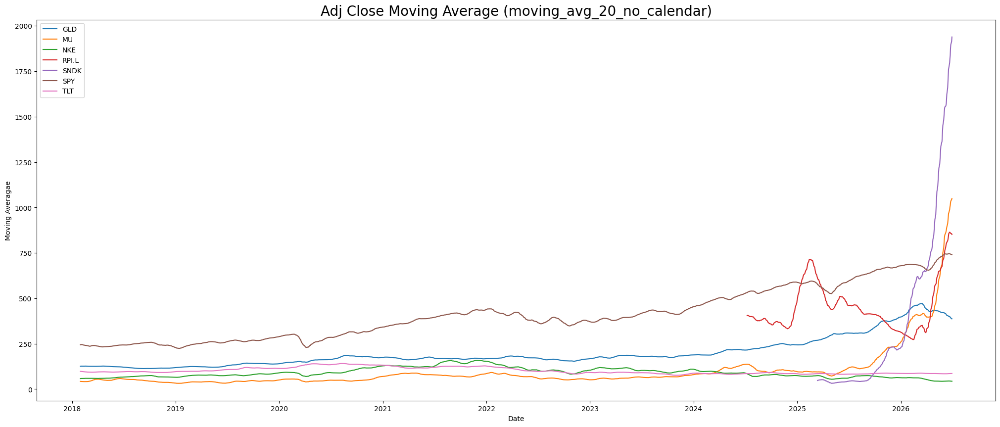

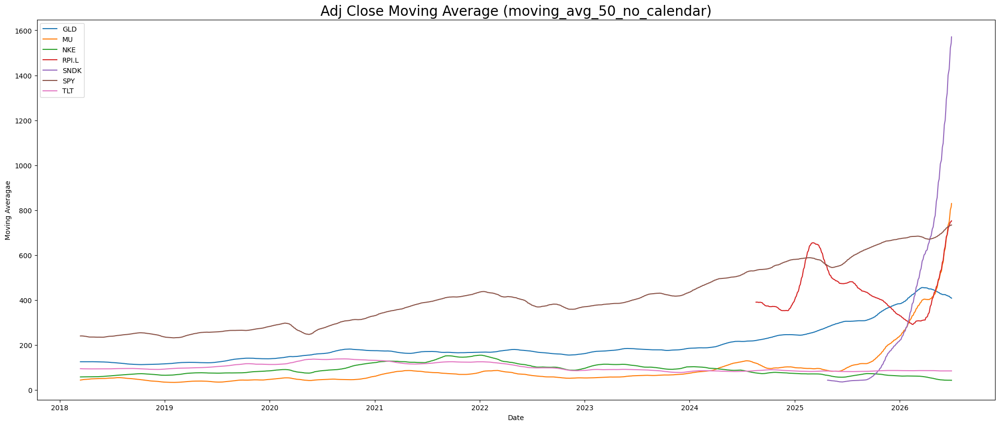

In [66]:
for ma_col in ma_cols:

    plt.figure(figsize=(25,10))

    for ticker, group in df.groupby("ticker"):

        plt.plot(group["date"], group[ma_col], label=ticker)

    plt.title(f"Adj Close Moving Average ({ma_col})", fontsize=20)
    plt.legend()
    plt.xlabel("Date")
    plt.ylabel("Moving Averagae")
    plt.show()


Lots of crossovers recently indicate a volatile market. The visualisation also tends to be skewed by the extreme high prices of AI related assets.

"Safe" assets like TLT and GLD seem to have a general downwards trends across move 20 and 50 days horizons.

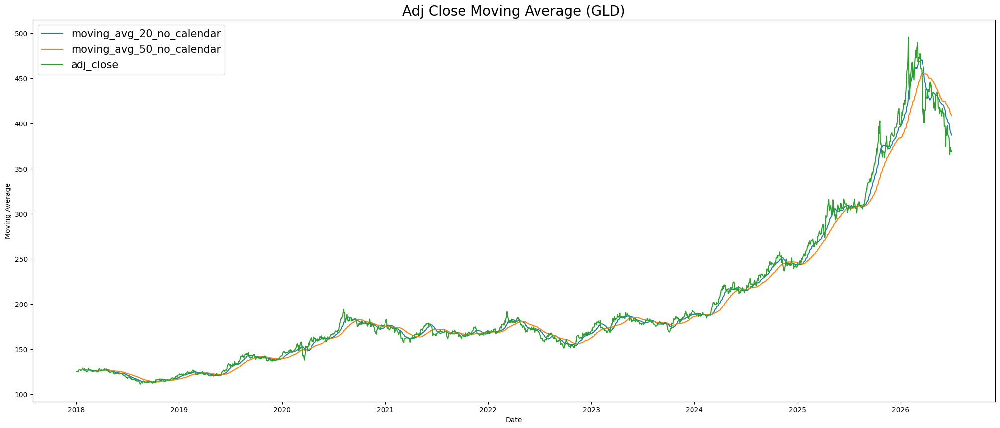

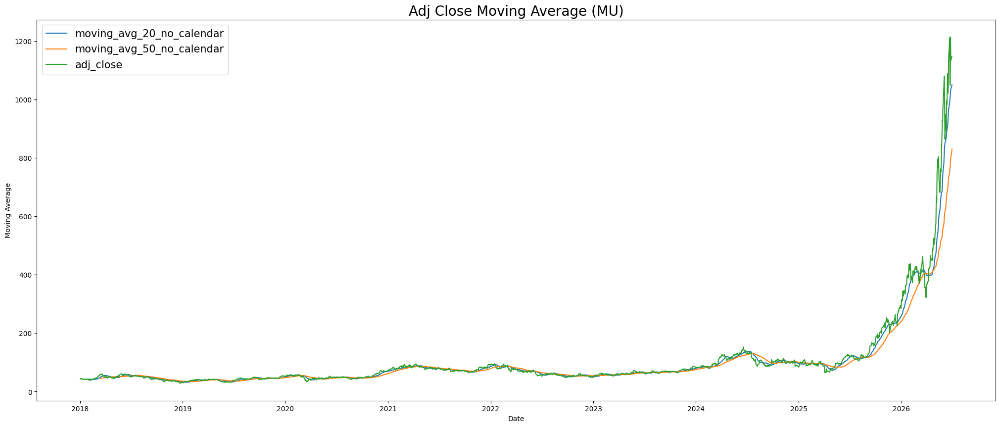

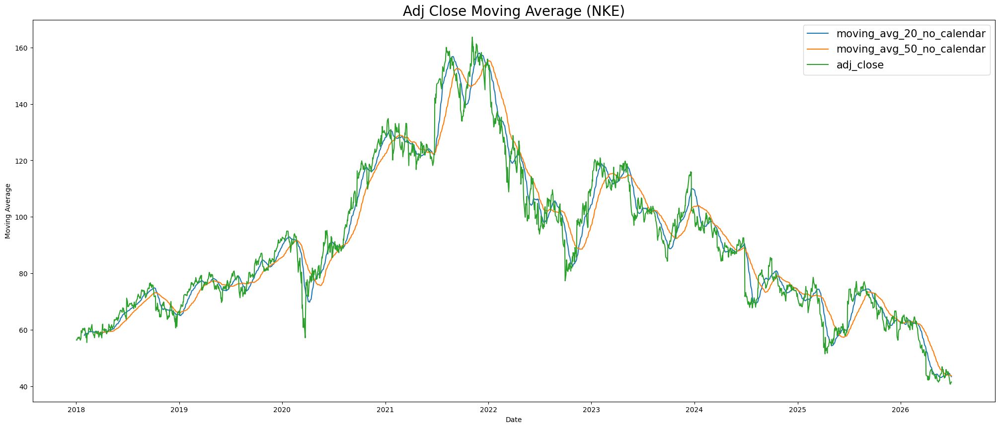

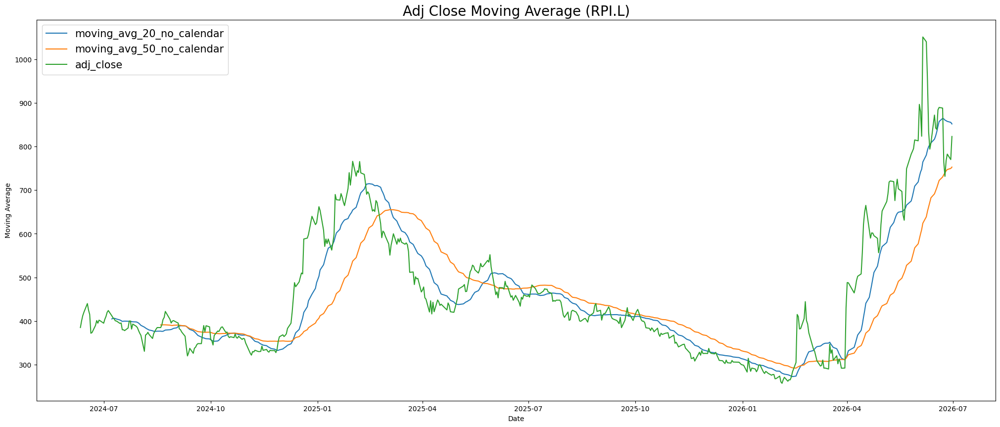

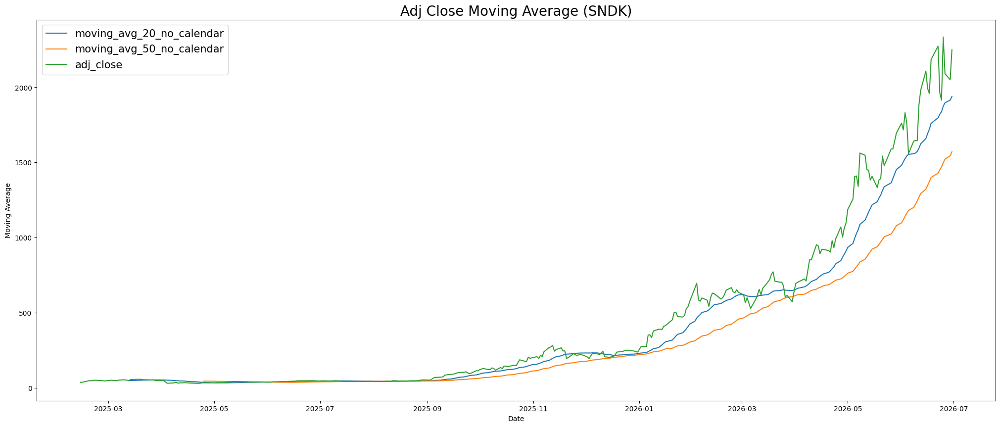

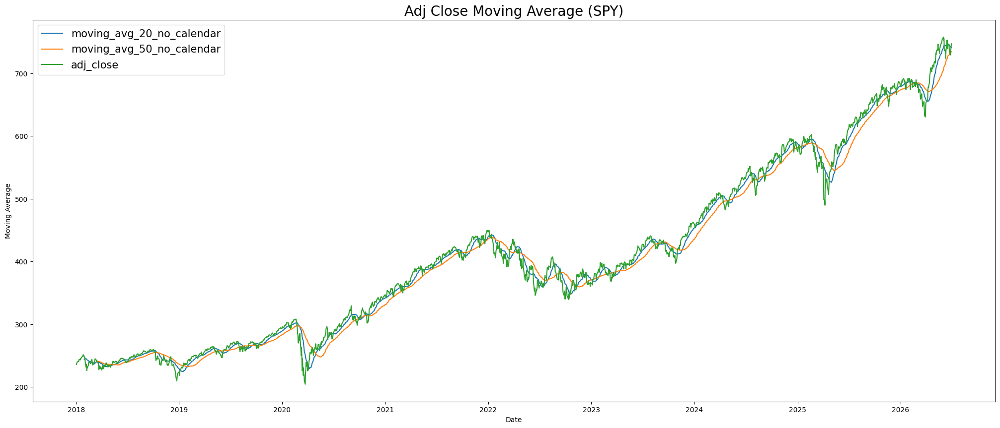

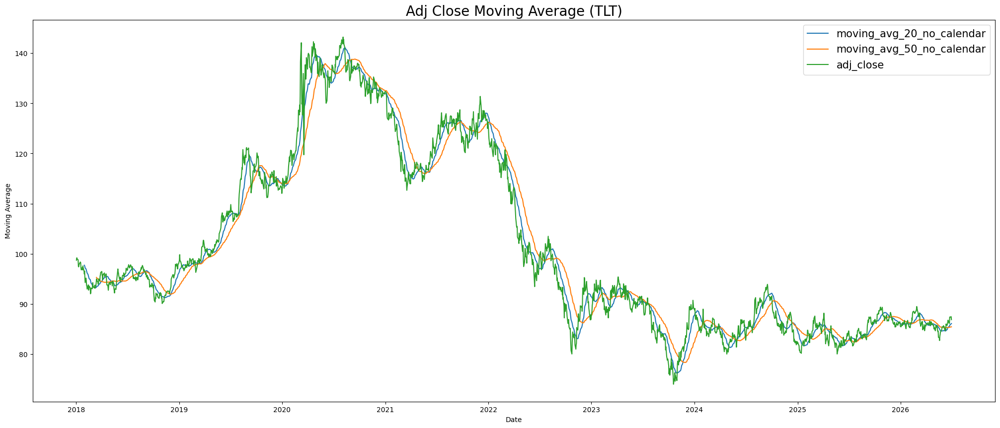

In [69]:
ma_cols = ma_cols + ["adj_close"]

for ticker, group in df.groupby("ticker"):

    plt.figure(figsize=(25,10))

    for ma_col in ma_cols:

        plt.plot(group["date"], group[ma_col], label=ma_col)

    plt.title(f"Adj Close Moving Average ({ticker})", fontsize=20)
    plt.legend(fontsize=15)
    plt.xlabel("Date")
    plt.ylabel("Moving Average")
    plt.show()


Trend further supported here where AI related assets sees price above moving average indicating an upward trend, while "safe" assets have price below moving average indicating a downward trend.

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


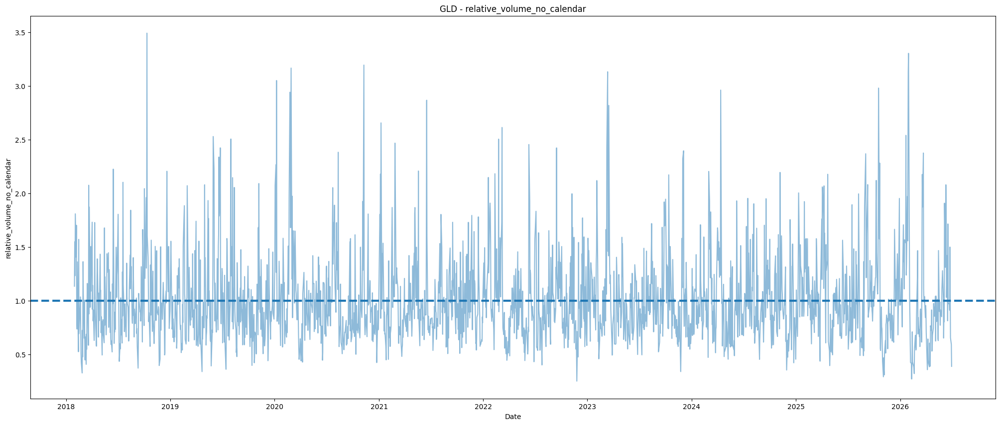

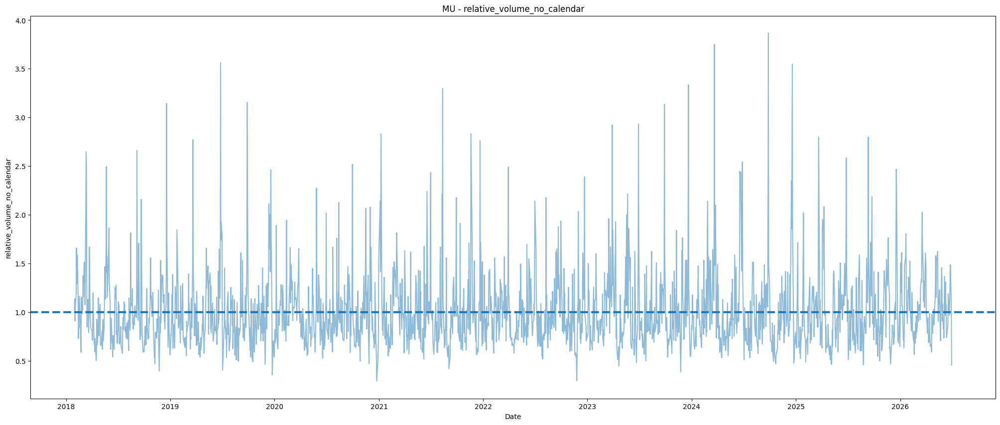

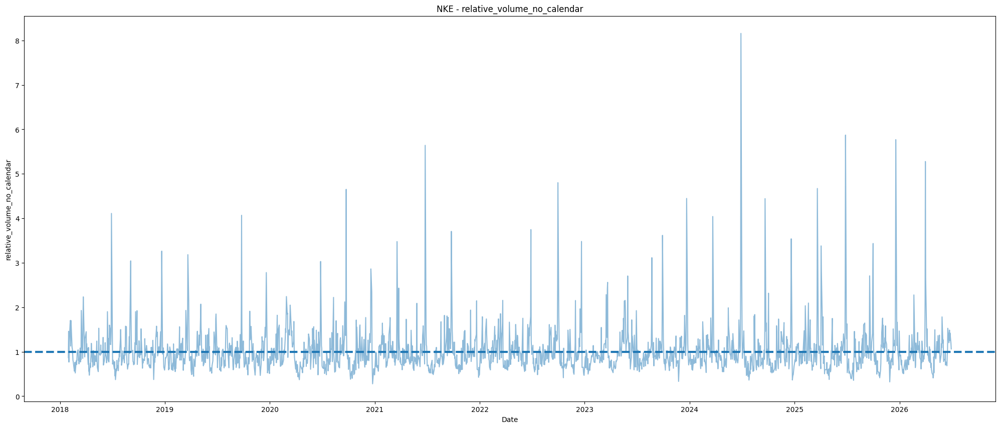

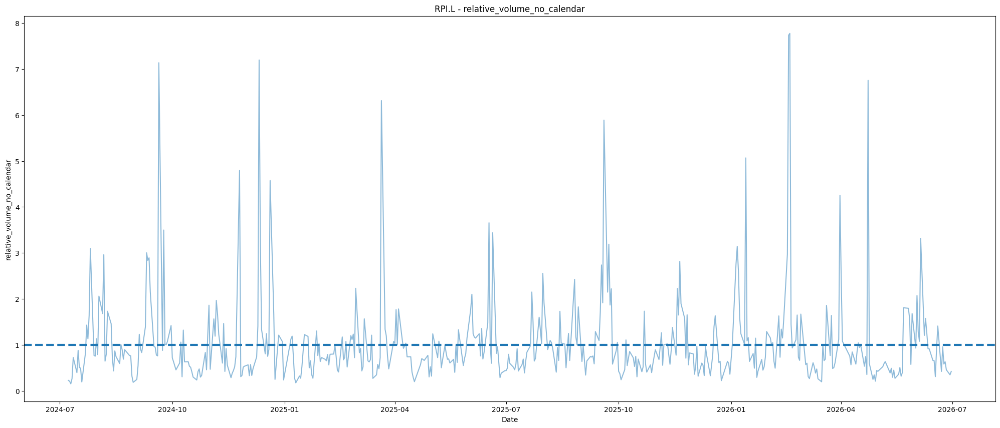

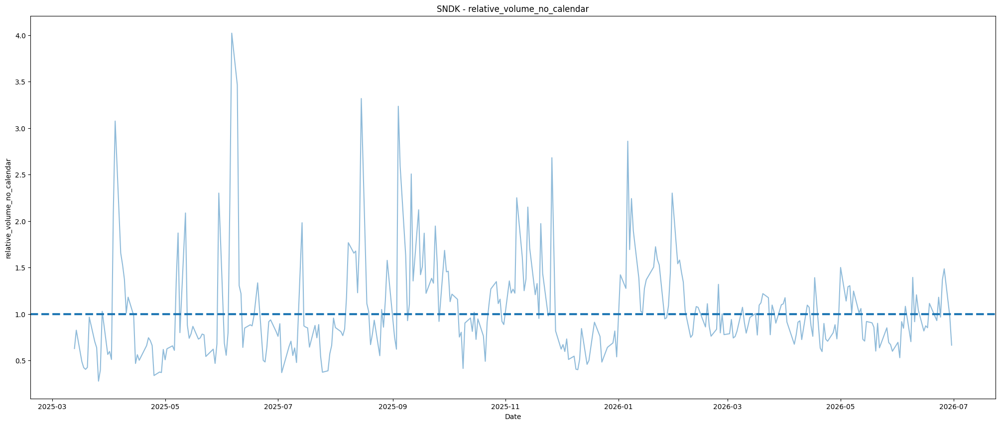

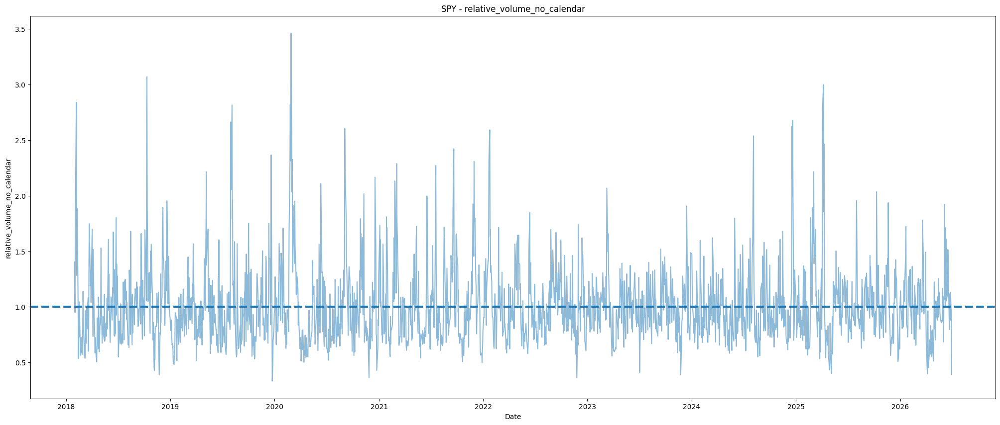

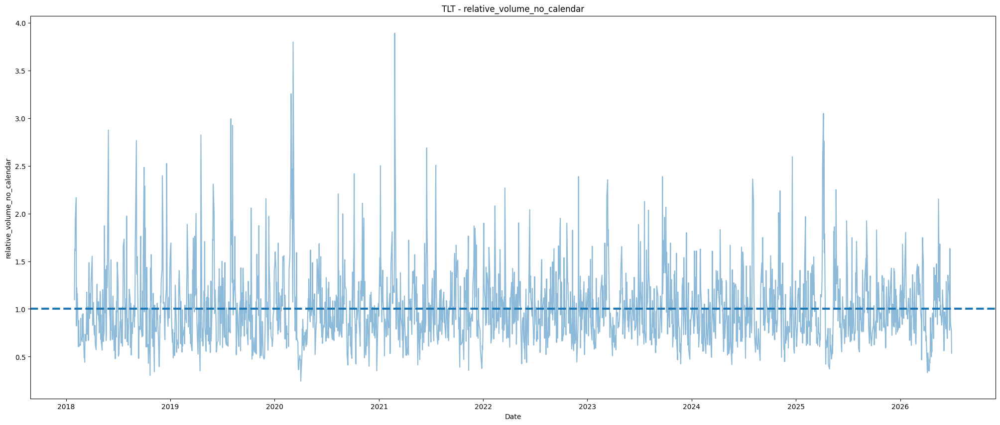

In [85]:
df = pull_calendar_table(
    table_name=TABLE_NAME,
    calendar=CALENDAR
)


RELATIVE_VOL = f"relative_volume_{CALENDAR}"

for ticker, group in df.groupby("ticker"):
    group = group.sort_values("date")

    plt.figure(figsize=(25, 10))

    plt.plot(
        group["date"],
        group[RELATIVE_VOL],
        alpha=0.5
    )

    plt.axhline(1, linestyle="--", linewidth=3)

    plt.xlabel("Date")
    plt.ylabel(RELATIVE_VOL)
    plt.title(f"{ticker} - {RELATIVE_VOL}")

    plt.show()

In [82]:
import pandas as pd

TABLE_NAME="price_features"
CALENDAR="no_calendar"

df = pull_calendar_table(
    table_name=TABLE_NAME,
    calendar=CALENDAR
)

df.columns

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


Index(['ticker', 'date', 'open', 'high', 'low', 'close', 'adj_close', 'volume',
       'daily_return_no_calendar', 'log_return_no_calendar',
       'cumulative_returns_no_calendar', 'rolling_7d_return_no_calendar',
       'rolling_30d_return_no_calendar', 'lag_1_return_no_calendar',
       'lag_5_return_no_calendar', 'moving_avg_20_no_calendar',
       'moving_avg_50_no_calendar', 'price_vs_ma20_no_calendar',
       'relative_volume_no_calendar', 'rolling_30d_volatility_no_calendar',
       'drawdown_no_calendar', 'target_next_day_return_no_calendar',
       'target_direction_no_calendar'],
      dtype='str')

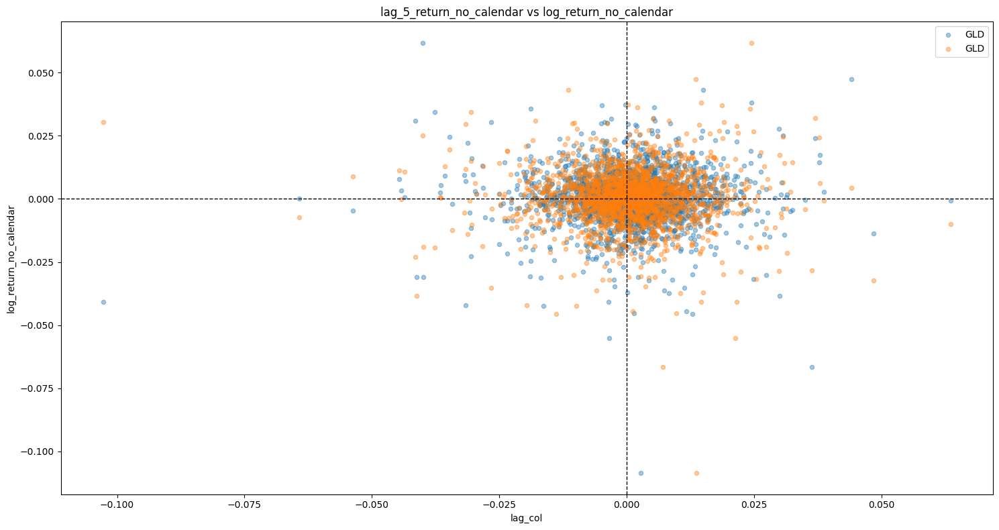

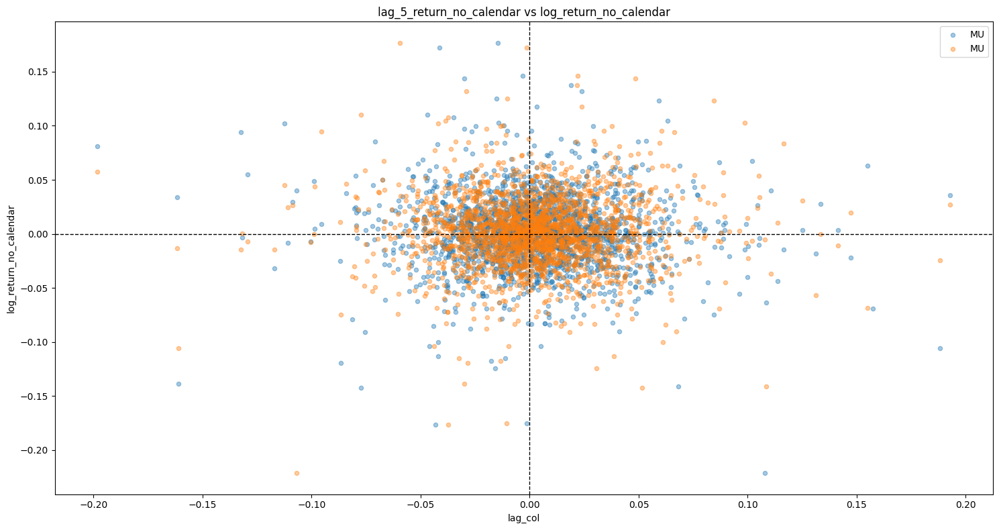

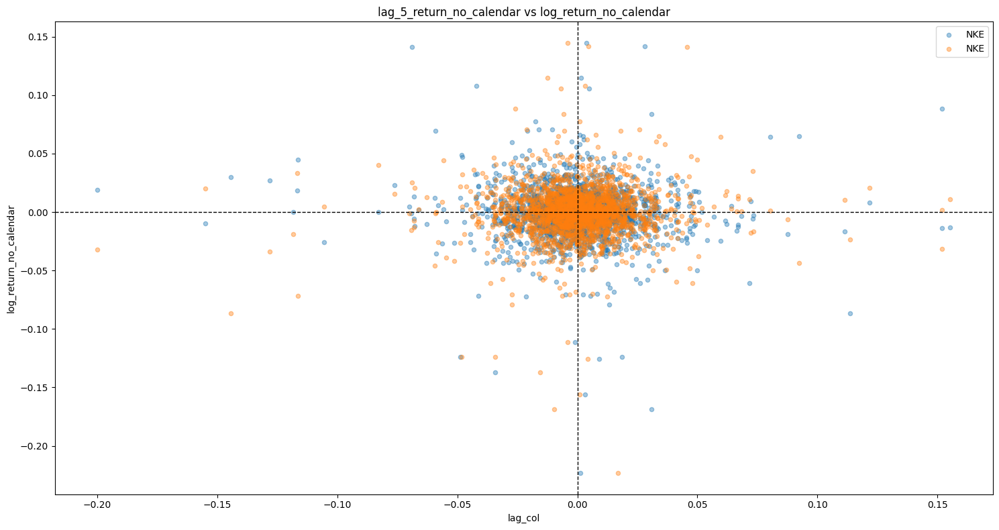

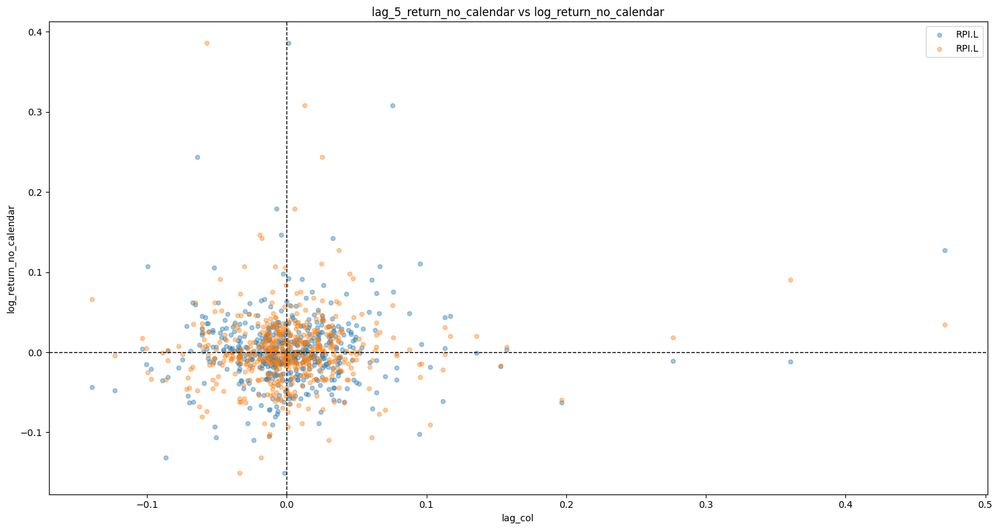

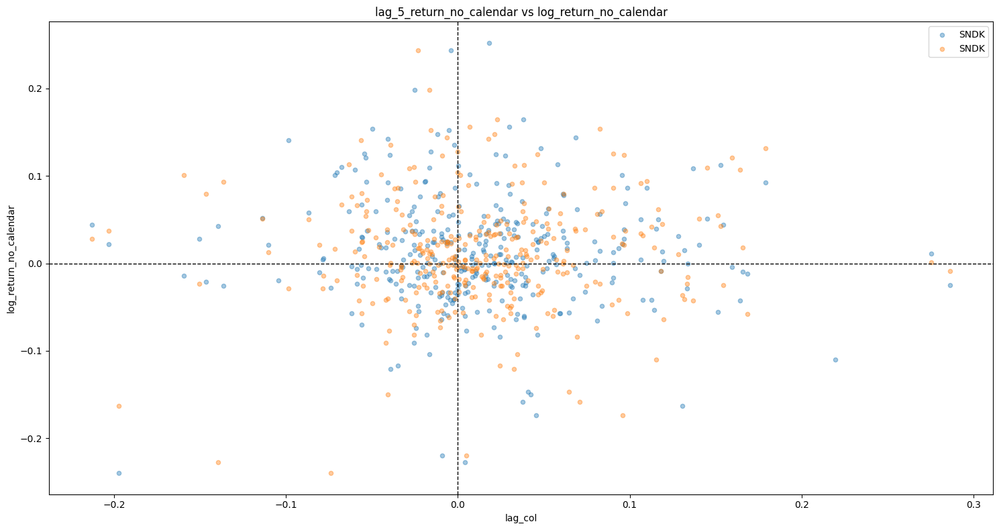

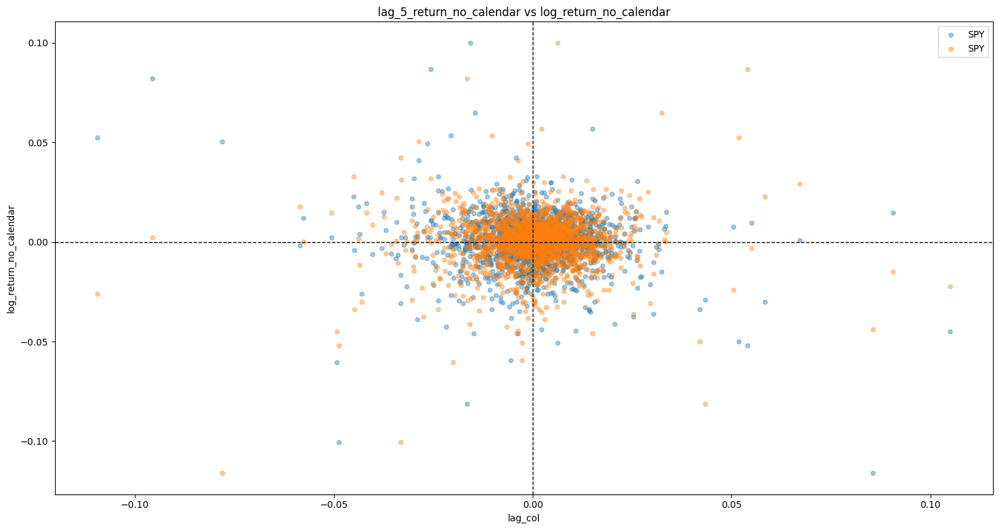

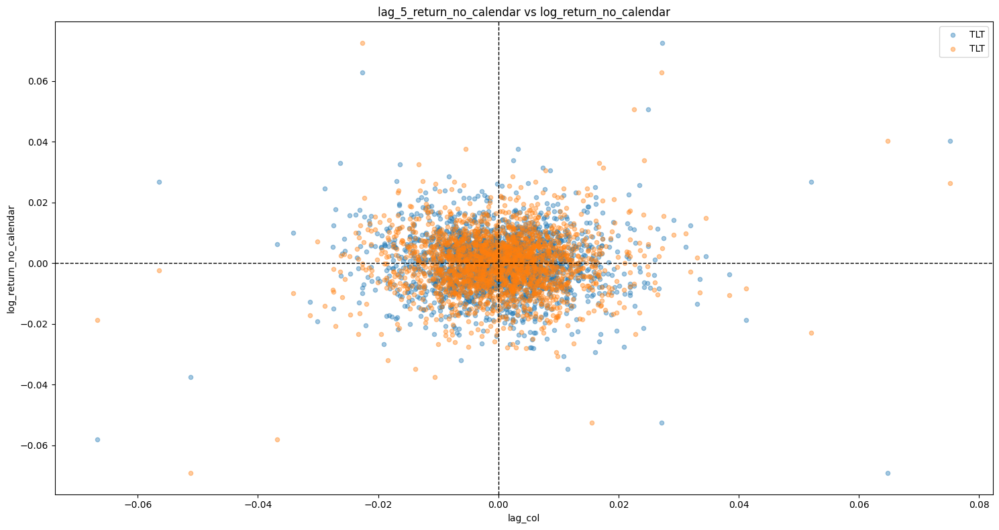

In [90]:
lag_cols = df.columns[
    df.columns.str.contains("lag", case=False, na=False)
].to_list()

target_col = f"log_return_{CALENDAR}"

for ticker, group in df.groupby("ticker"):

    plt.figure(figsize=(15, 8))

    for lag_col in lag_cols:

        plot_df = group[[lag_col, target_col]].dropna()

        if plot_df.empty:
            continue

        plt.scatter(
            plot_df[lag_col],
            plot_df[target_col],
            alpha=0.4,
            s=20,
            label=ticker
        )

    plt.xlabel("lag_col")
    plt.ylabel(target_col)
    plt.title(f"{lag_col} vs {target_col}")
    plt.axhline(0, color="black", linestyle="--", linewidth=1)
    plt.axvline(0, color="black", linestyle="--", linewidth=1)
    plt.legend()
    plt.tight_layout()
    plt.show()

All points clustered round zero indicating not or weak relationships.

In [ ]:
import pandas as pd

TABLE_NAME="price_features"
CALENDAR="no_calendar"

df = pull_calendar_table(
    table_name=TABLE_NAME,
    calendar=CALENDAR
)

df.columns

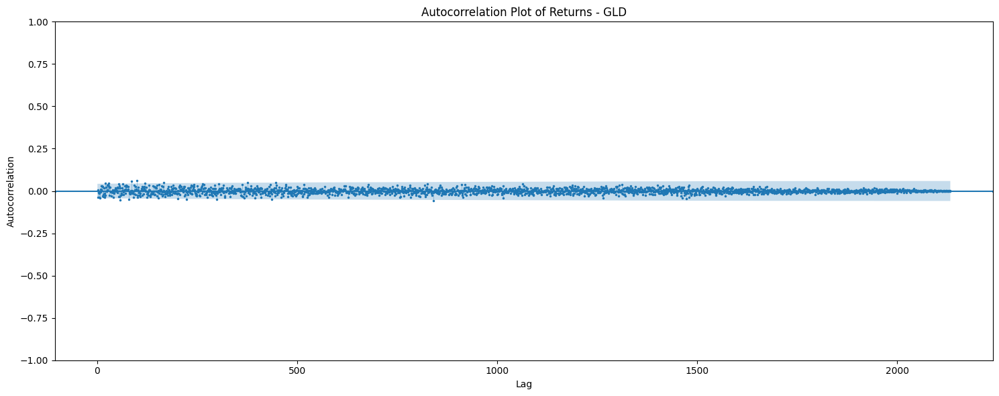

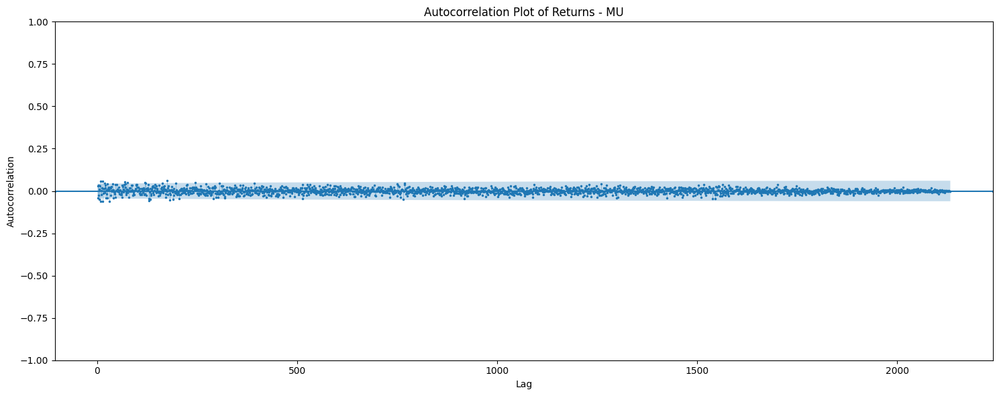

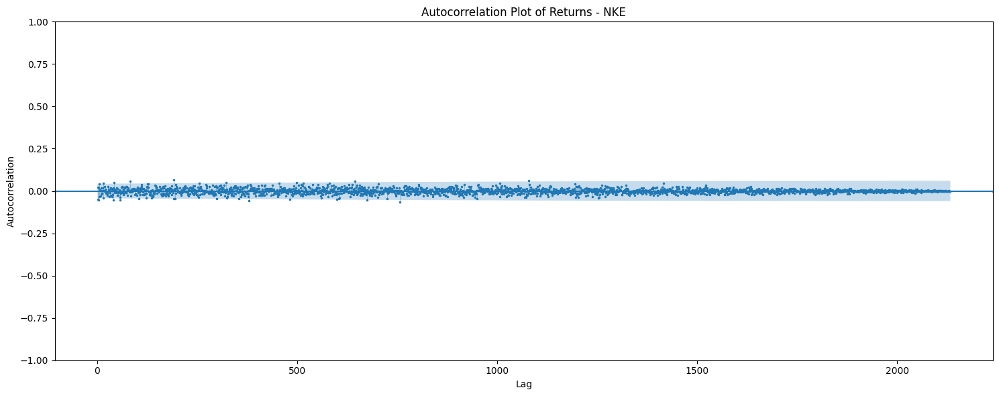

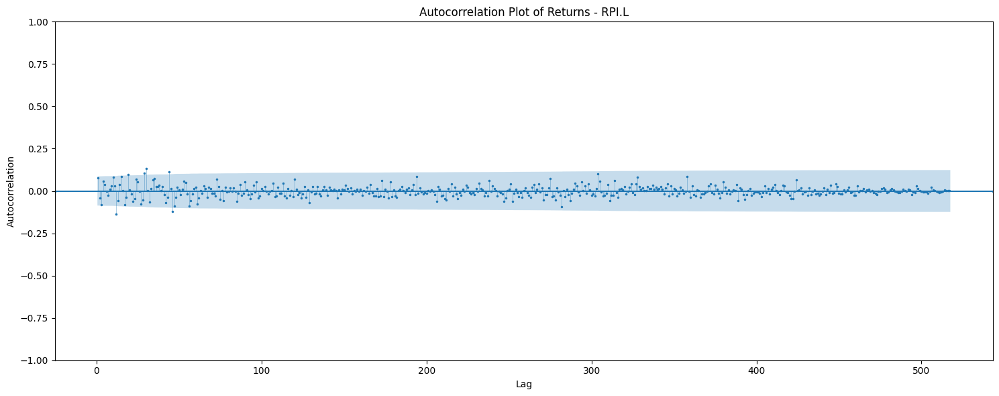

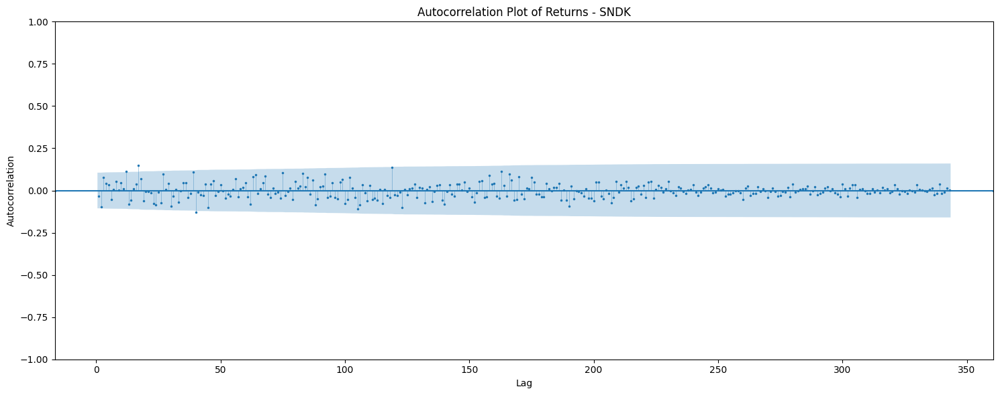

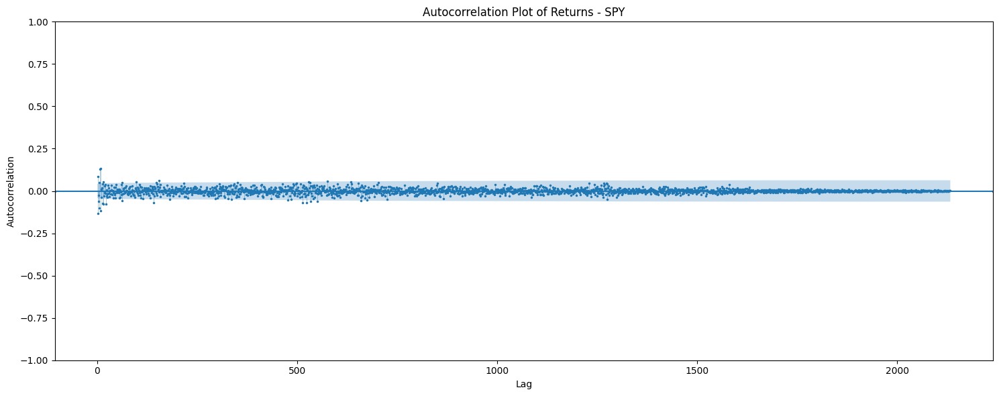

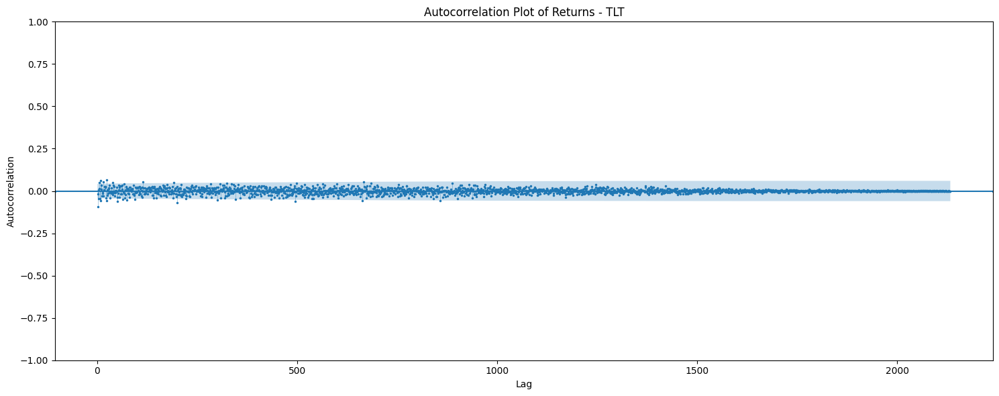

In [101]:
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

return_col = f"log_return_{CALENDAR}"

for ticker, group in df.groupby("ticker"):

    group = group.sort_values("date")
    series = group[return_col].dropna()

    if len(series) < 2:
        continue

    max_lags = len(series)-1

    fig, ax = plt.subplots(figsize=(15, 6))

    plot_acf(
        series,
        lags=max_lags,
        zero=False,
        ax=ax,
        marker=".",
        markersize=3,
        vlines_kwargs={
            "linewidth": 0.5,
            "alpha": 0.5
        }
    )

    ax.set_title(f"Autocorrelation Plot of Returns - {ticker}")
    ax.set_xlabel("Lag")
    ax.set_ylabel("Autocorrelation")
    plt.tight_layout()
    plt.show()

No strong autocorrelation

In [102]:
import pandas as pd

TABLE_NAME="price_features"
CALENDAR="no_calendar"

df = pull_calendar_table(
    table_name=TABLE_NAME,
    calendar=CALENDAR
)

df.columns

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


Index(['ticker', 'date', 'open', 'high', 'low', 'close', 'adj_close', 'volume',
       'daily_return_no_calendar', 'log_return_no_calendar',
       'cumulative_returns_no_calendar', 'rolling_7d_return_no_calendar',
       'rolling_30d_return_no_calendar', 'lag_1_return_no_calendar',
       'lag_5_return_no_calendar', 'moving_avg_20_no_calendar',
       'moving_avg_50_no_calendar', 'price_vs_ma20_no_calendar',
       'relative_volume_no_calendar', 'rolling_30d_volatility_no_calendar',
       'drawdown_no_calendar', 'target_next_day_return_no_calendar',
       'target_direction_no_calendar'],
      dtype='str')

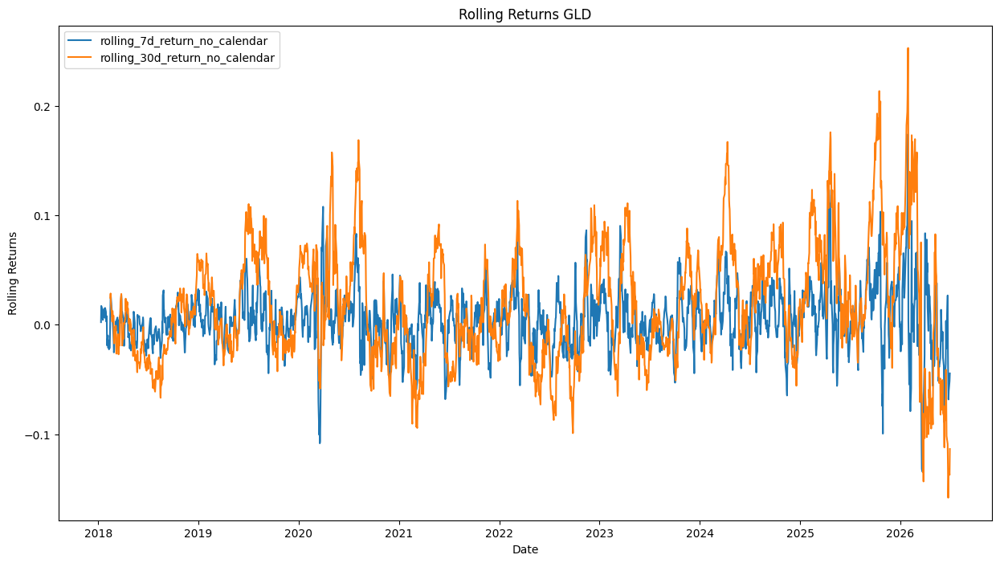

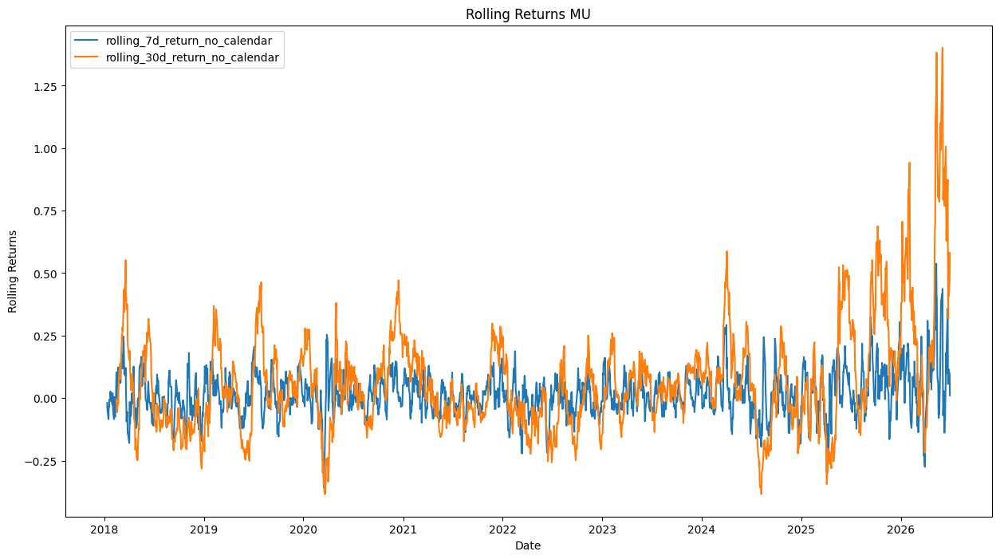

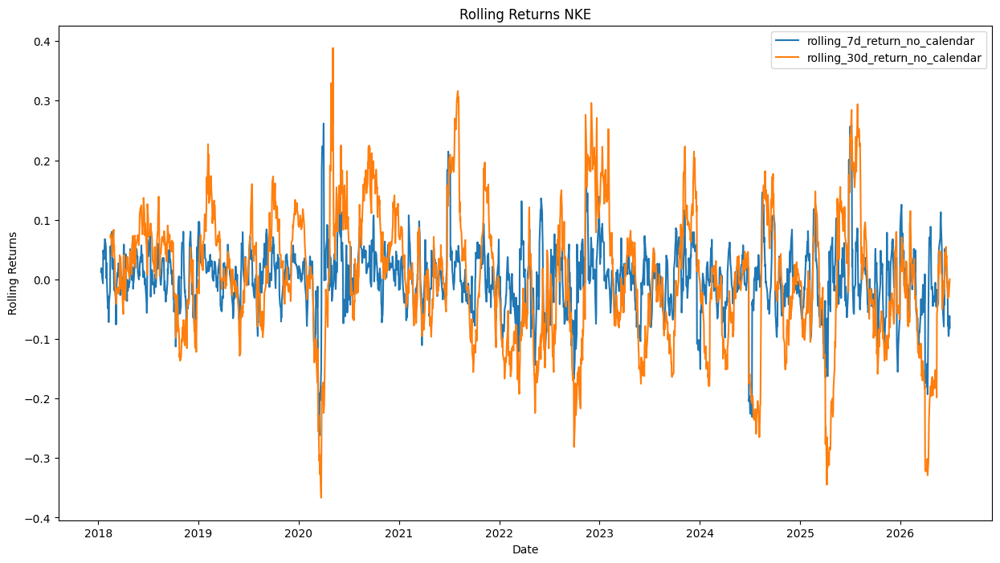

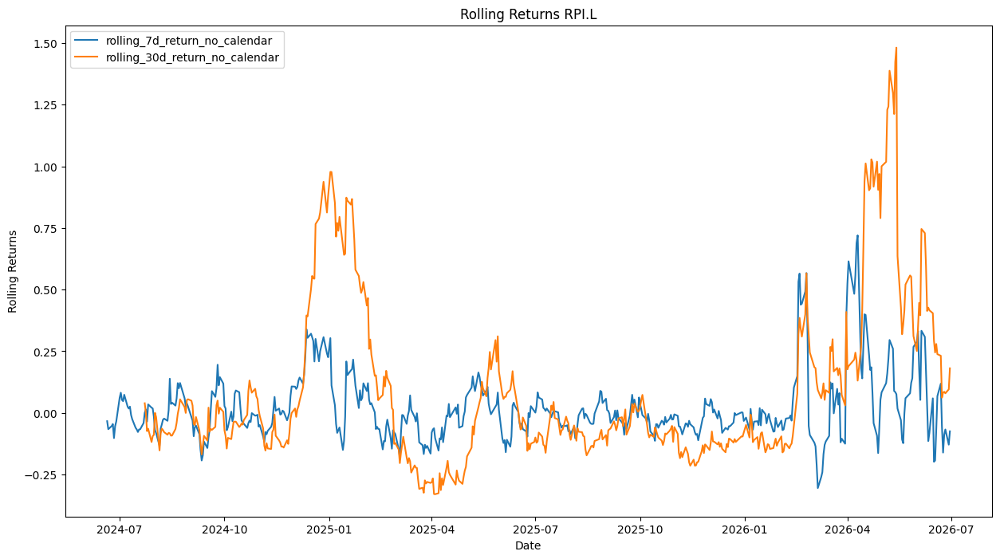

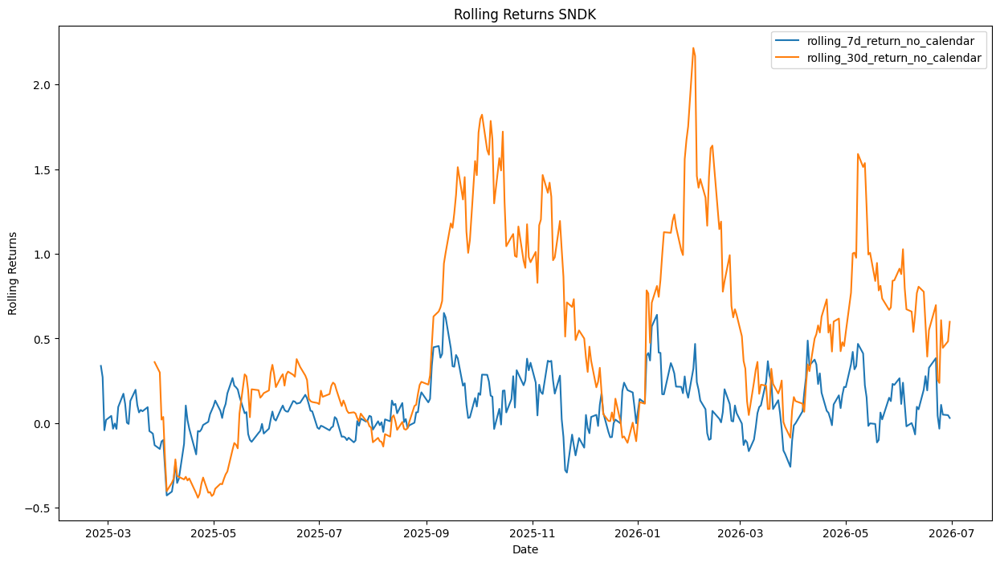

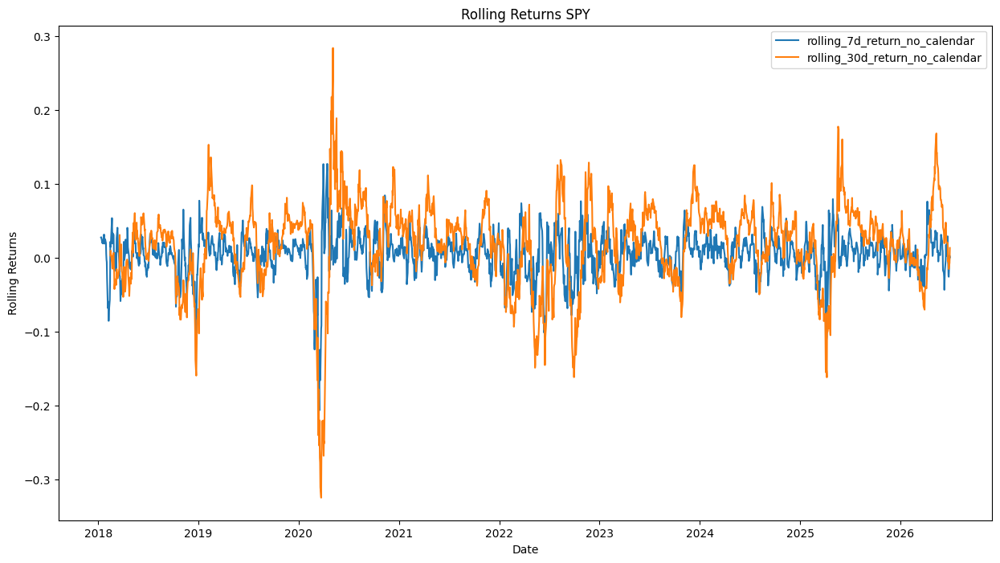

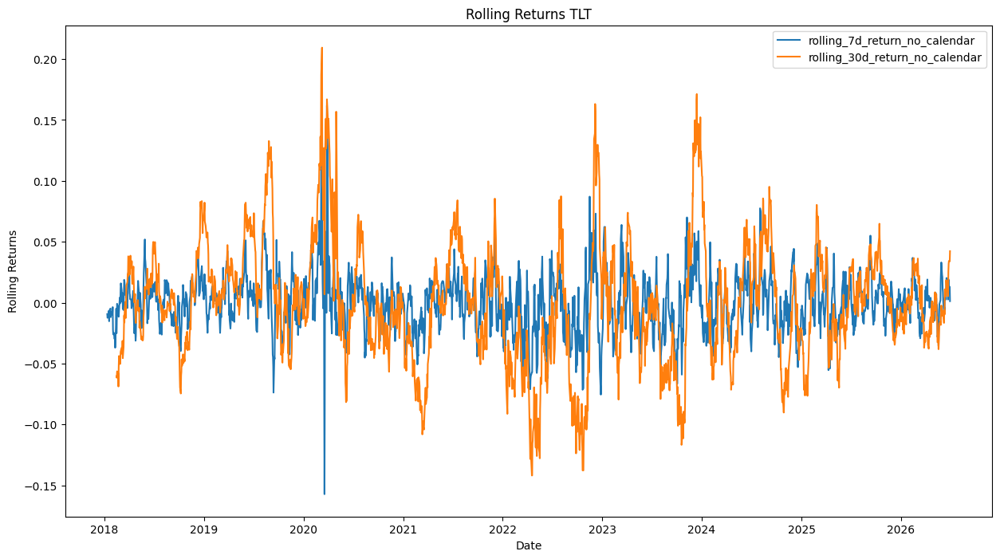

In [111]:
rolling_returns = df.columns[
    df.columns.str.contains("rolling", case=False, na=False)
    & df.columns.str.contains("return", case=False, na=False)
    ].to_list()

for ticker, group in df.groupby("ticker"):

    plt.figure(figsize=(15,8))

    for rol_col in rolling_returns:

        plt.plot(group["date"], group[rol_col], label=rol_col)

    plt.xlabel("Date")
    plt.ylabel("Rolling Returns")
    plt.title(f"Rolling Returns {ticker}")
    plt.legend()
    plt.show()


AI related assets experience huge spikes. On this time frame all assets look volatile but that is because the time frame is large.

In [112]:
import pandas as pd

TABLE_NAME="price_features"
CALENDAR="no_calendar"

df = pull_calendar_table(
    table_name=TABLE_NAME,
    calendar=CALENDAR
)

df.columns

[START] Connecting to database...
[START] Reading price_features
[DONE] Read price_features
[START] Building no_calendar required columns...
[DONE] Filtered to no_calendar
[DONE] Prepared and sorted table


Index(['ticker', 'date', 'open', 'high', 'low', 'close', 'adj_close', 'volume',
       'daily_return_no_calendar', 'log_return_no_calendar',
       'cumulative_returns_no_calendar', 'rolling_7d_return_no_calendar',
       'rolling_30d_return_no_calendar', 'lag_1_return_no_calendar',
       'lag_5_return_no_calendar', 'moving_avg_20_no_calendar',
       'moving_avg_50_no_calendar', 'price_vs_ma20_no_calendar',
       'relative_volume_no_calendar', 'rolling_30d_volatility_no_calendar',
       'drawdown_no_calendar', 'target_next_day_return_no_calendar',
       'target_direction_no_calendar'],
      dtype='str')

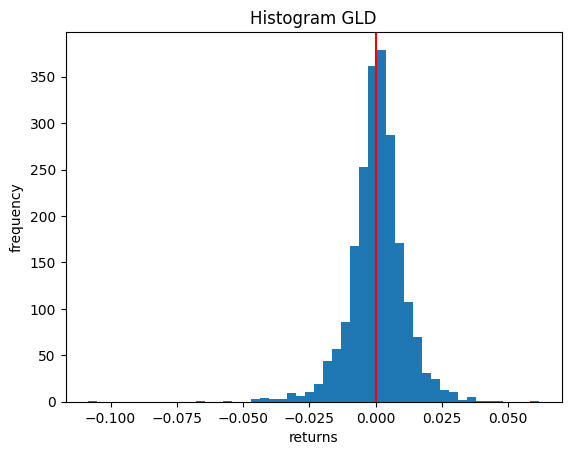

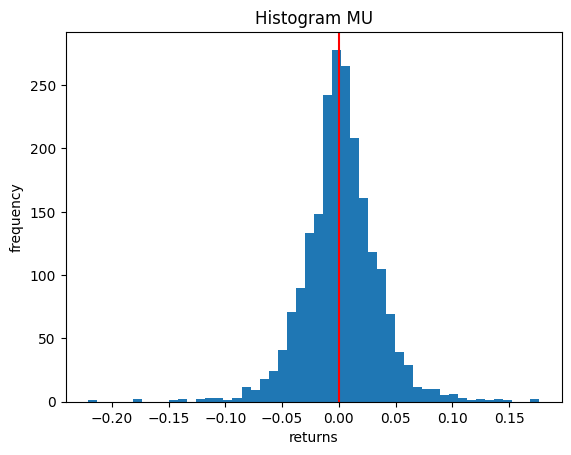

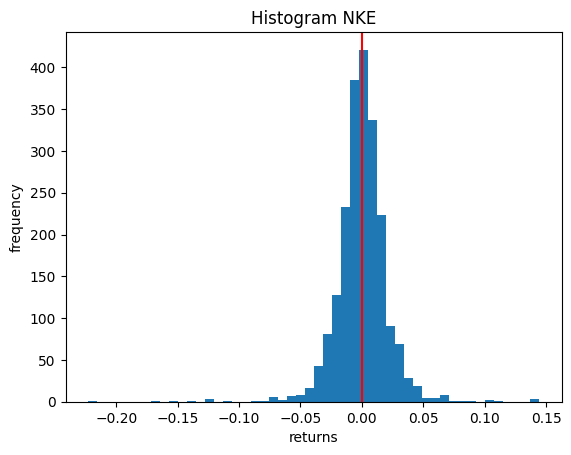

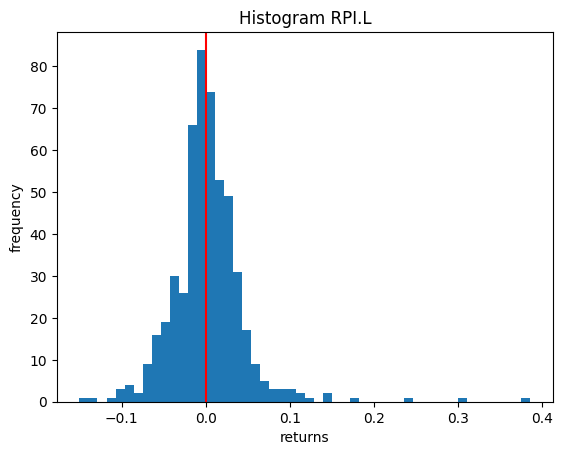

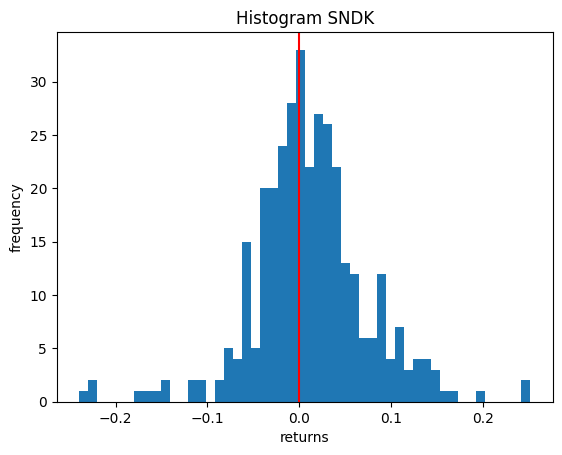

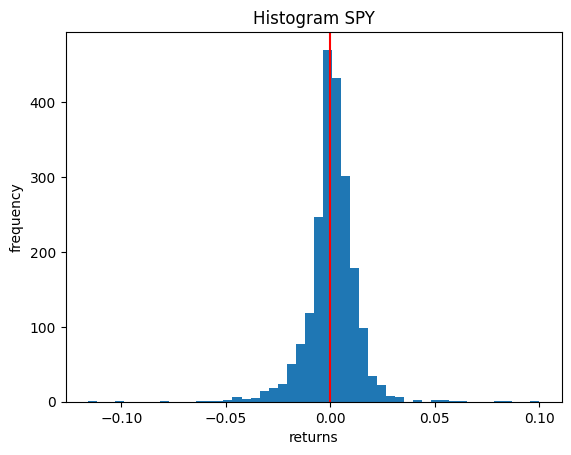

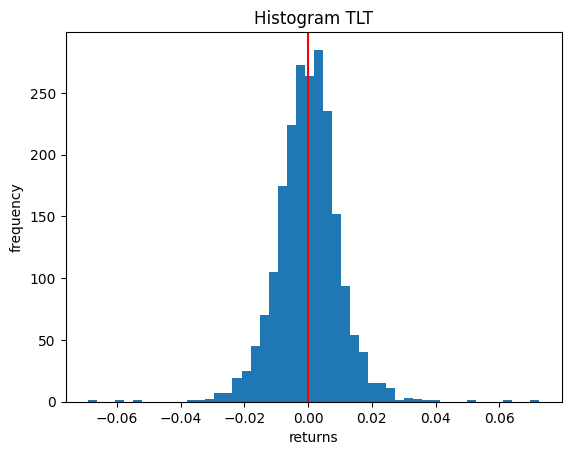

In [117]:
for ticker, group in df.groupby("ticker"):

    plt.hist(group["log_return_no_calendar"].dropna(), bins=50)

    plt.xlabel("returns")
    plt.ylabel("frequency")
    plt.title(f"Histogram {ticker}")

    plt.axvline(0, color="red")

    plt.show()

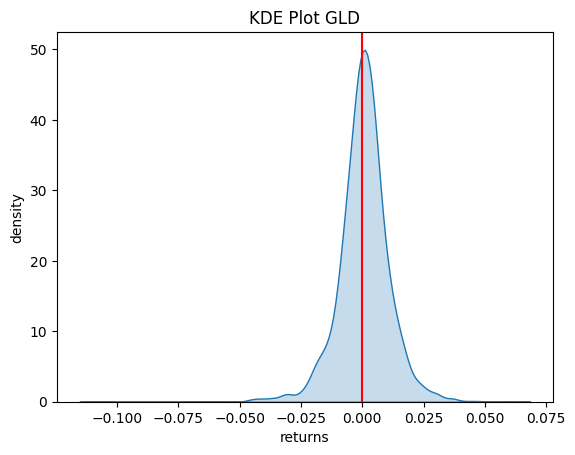

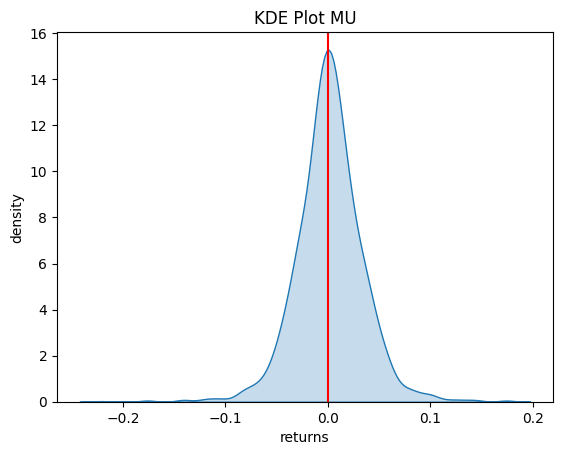

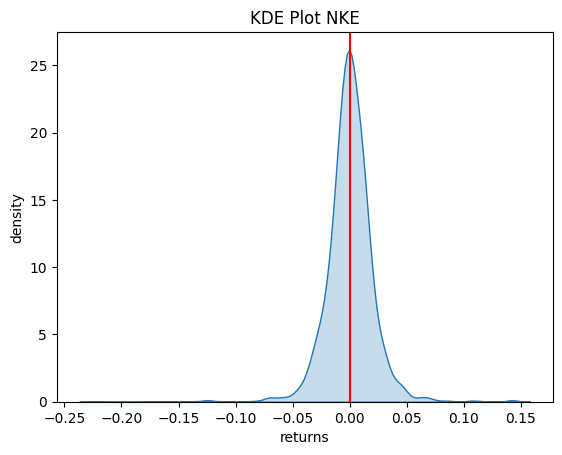

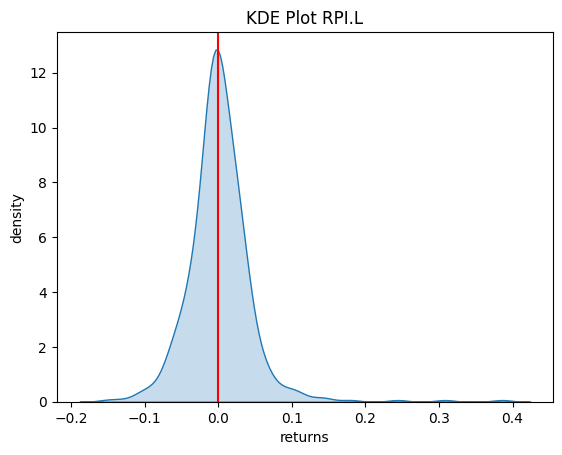

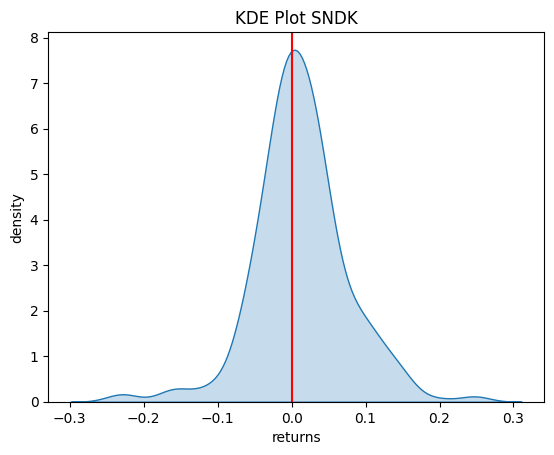

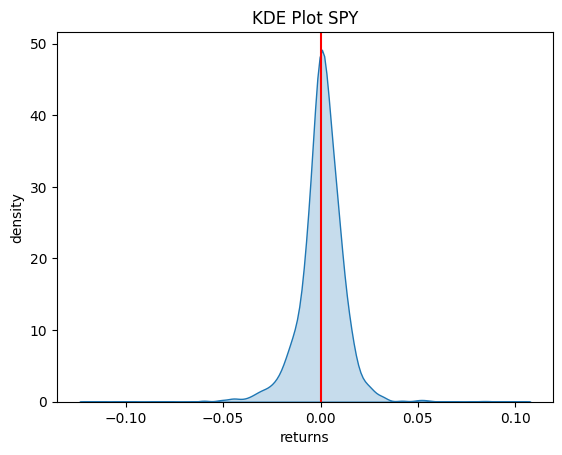

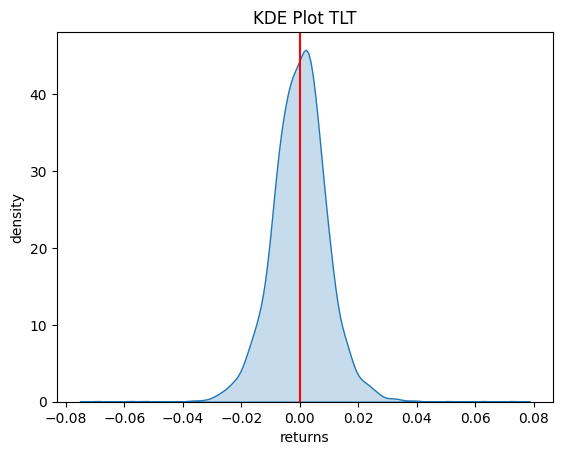

In [122]:
import seaborn as sns

for ticker, group in df.groupby("ticker"):

    sns.kdeplot(group["log_return_no_calendar"], fill=True)

    plt.xlabel("returns")
    plt.ylabel("density")
    plt.title(f"KDE Plot {ticker}")

    plt.axvline(0, color="red")

    plt.show()

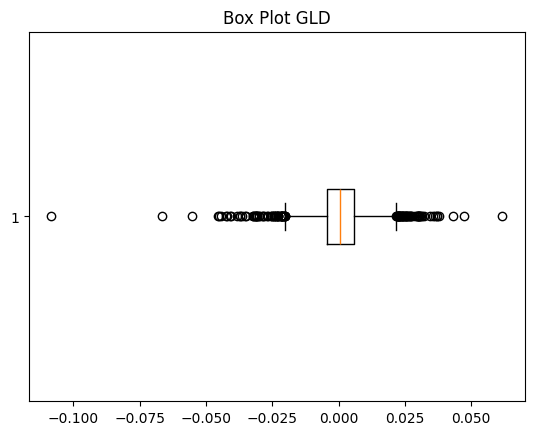

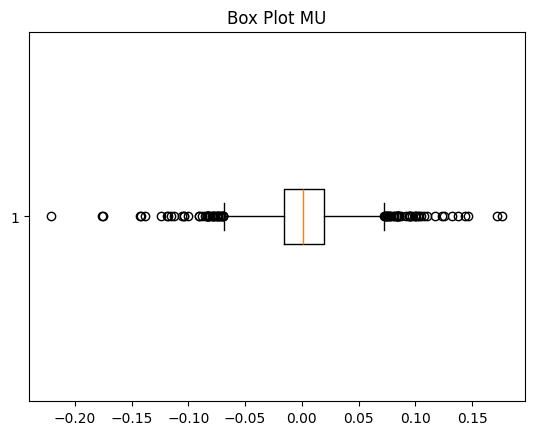

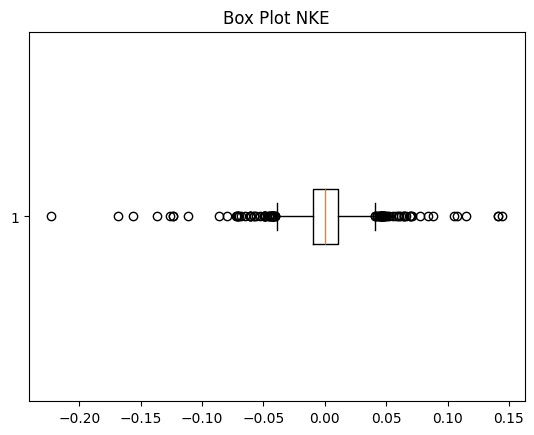

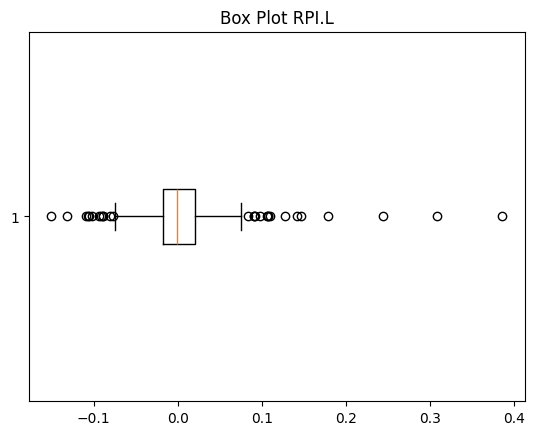

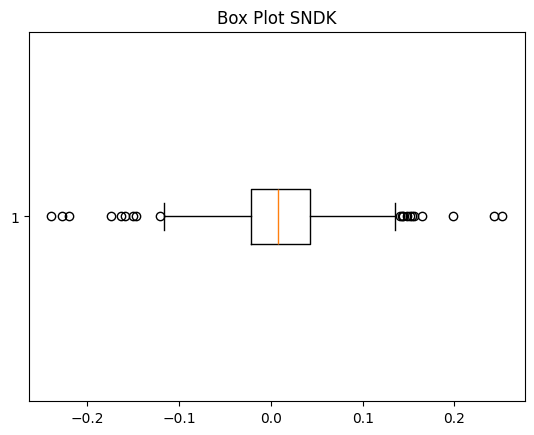

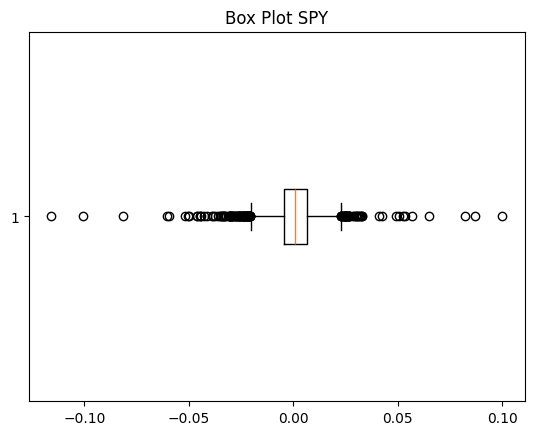

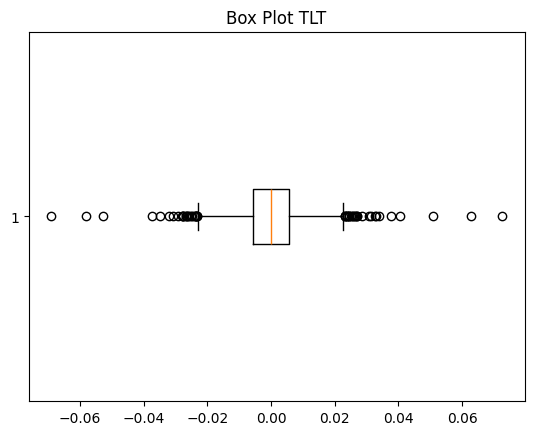

In [123]:
for ticker, group in df.groupby("ticker"):

    plt.boxplot(group["log_return_no_calendar"].dropna(), vert=False)

    plt.title(f"Box Plot {ticker}")

    plt.show()